# Analysis of Bank Direct Marketing Campaign

#### Jim Beno, for U.C. Berkeley Certificate in Machine Learning & Artificial Intelligence

### Table of Contents

* **[Business Understanding](#Business-Understanding)**
    * [Background](#Background)
    * [Business Objectives and Success Criteria](#Business-Objectives-and-Success-Criteria)
    * [Inventory of Resources](#Inventory-of-Resources)
    * [Requirements, Assumptions and Constraints](#Requirements,-Assumptions-and-Constraints)
    * [Risks and Contingencies](#Risks-and-Contingencies)
    * [Terminology](#Terminology)
    * [Costs and Benefits](#Costs-and-Benefits)
    * [Data Mining Goals and Success Criteria](#Data-Mining-Goals-and-Success-Criteria)
    * [Project Plan](#Project-plan)
    * [Initial Assessment of Tools and Techniques](#Initial-Assessment-of-Tools-and-Techniques)
* **[Data Understanding](#Data-Understanding)**
    * [Data Collection](#Data-Collection)
    * [Data Description](#Data-Description)
    * [Import Libraries](#Import-Libraries)
    * [Load Data](#Load-Data)
    * [Investigate Missing or Problematic Data](#Investigate-Missing-or-Problematic-Data)
        * [Check for Null Values](#Check-for-Null-Values)
        * [Count the Unknown Values](#Count-the-Unknown-Values)
        * [Check for Zero Values](#Check-for-Zero-Values)
        * [Check for Outliers](#Check-for-Outliers)
        * [Look at Unique Values](#Look-at-Unique-Values)
        * [Check Unique Identifiers](#Check-Unique-Identifiers)
        * [Check for Duplicate Records](#Check-for-Duplicate-Records)
    * [Define Column Lists](#Define-Column-Lists)
    * [Data Exploration](#Data-Exploration)
        * [Categorical Distributions](#Categorical-Distributions)
        * [Continuous Distributions](#Continuous-Distributions)
    * [Data Quality Plan](#Data-Quality-Plan)
* **[Data Preparation](#Data-Preparation)**
    * [Data Cleaning](#Data-Cleaning)
    	* [Biased Variables](#Biased-Variables)
    	* [Unknown Variables](#Unknown-Variables)
    	* [999 Values](#999-Values)
    	* [Log Transformation](#Log-Transformation)
    	* [y Variable](#y-Variable)
        * [Clean Up the Index](#Clean-Up-the-Index)
        * [Results of Data Cleaning](#Results-of-Data-Cleaning)
    * [Data Encoding](#Data-Encoding)
        * [One-Hot Encoding](#One-Hot-Encoding)
        * [Sanity Check](#Sanity-Check)
    * [Explore Correlations](#Explore-Correlations)
        * [Correlation Matrix](#Correlation-Matrix)
        * [Individual Correlation Charts](#Individual-Correlation-Charts)
        * [Create Dataframe of Top Correlated Features](#Create-Dataframe-of-Top-Correlated-Features)
    * [Multivariate Charts](#Multivariate-Charts)
* **[Model Building and Analysis](#Model-Building-and-Analysis)**
	* [Test Design](#Test-Design)
	* [Data Processing](#Data-Processing)
		* [Update X and y Columns](#Update-X-and-y-Columns)
		* [Separate X and Y](#Separate-X-and-Y)
		* [Training, Validation and Test Splits](#Training,-Validation-and-Test-Splits)
		* [Baseline Models](#Baseline-Models)
	* [Logistic Regression Model with Defaults](#Logistic-Regression-Model-with-Defaults)
	* [Logistic Regression Model with Oversampling and Balanced Weights](#Logistic-Regression-Model-with-Oversampling-and-Balanced-Weights)
	* [Model Iteration](#Model-Iteration)
	* [Review Model Performance](#Review-Model-Performance)
* **[Summary of Findings](#Summary-of-Findings)**
	* [Descriptive Statistics](#Descriptive-Statistics)
	* [Business Objectives](#Business-Objectives)
    * [Limitations](#Limitations)
    * [Next Steps and Recommendations](#Next-Steps-and-Recommendations)

# Business Understanding

## Background

European banks need to strengthen their financial assets. One approach is to offer long-term deposits with low interest rates through direct marketing campaigns. At the same time, they also need to reduce their costs and turnaround time. The problem is, the public has experienced some fatigue from all these campaigns, and they are not as effective as they could be. Can we learn from the data to find out what customer attributes increase the chance of a successful depost? If so, the campaigns can be tailored to these high-probability prospects, avoiding wasted time and resources on those that are less likely to deposit.

## Business Objectives and Success Criteria

* **Describe Characteristics of Depositers** – Identify the characteristics of prospects that end up depositing money, vs. those that don't. This will allow the banks to target the customers that are most likely to deposit.
* **Create Predictive Model** – Create a machine learning model that will classify prospects as either likely to deposit or not, based on their characteristics.
* **Compare Performance of Classifiers** – Compare the performance of the following classifiers: K-Nearest Neighbors, Logistic Regression, Decision Trees, and Support Vector Machines

## Inventory of Resources

For this project, we have the following resources:

* **Personnel:** (1) Data analyst (part-time)
* **Hardware:** (1) MacBook Pro 2.4 GHz 8-Core Intel Core i9 with 32GB memory. Note: We are limited to CPU processing.
* **Software:** Jupyter Notebook with the following Python libraries:
    * Data analysis: Pandas, NumPy, Missingno
    * Visualization: Matplotlib, Seaborn, Plotly 
    * Modeling: SciKit Learn Pre-processing, Compose, Pipeline, Feature selection, Scaling, Classification models, Model selection
* **Data:** Four datasets have been provided:
    * "bank-additional-full.csv" with all examples (41188) and 20 inputs, ordered by date (from May 2008 to November 2010), very close to the data analyzed in Moro et al., 2014
    * "bank-additional.csv" with 10% of the examples (4119), randomly selected from 1), and 20 inputs.
    * "bank-full.csv" with all examples and 17 inputs, ordered by date (older version of this dataset with less inputs). 
    * "bank.csv with" 10% of the examples and 17 inputs, randomly selected from 3 (older version of this dataset with less inputs). 

## Requirements, Assumptions and Constraints

* **Deliverables** must include:
    * A non-technical presentation that summarizes the key findings for the objectives listed above
    * A Jupyter notebook that shows every step of data processing and analysis
    * Both of these will be published in a public repository on Github that includes a Readme file
* **Data constraint:** We are limited to the dataset provided, no additional data can be collected
* **Time constraint:** The project is due on Oct 17, 2023, so there are 5 working days (7 days total)
* No prior work of this dataset by other parties can be leveraged – we will be starting from scratch

## Risks and Contingencies

* **Data risk:** The data may not be sufficient to develop a model with strong predictive power. However, we are confident that we can at a minimum describe the data and identify features that are highly correlated with making a deposit
* **Time and skills risk:** Given the skillset of the data analyst, there are limited machine learning techniques at our disposal. If we don't achieve conclusive results in the allotted timeframe, we can enlist additional resources in a second round.

## Terminology

There are a few terms used in this dataset that are unique to the domain. We will define them here:

* **Default** - When a bank customer fails to make their required loan payments on time.
* **Deposit** - Money that a customer places into their bank account. The marketing campaign aims to get customers to make a new deposit.
* **Subscribed to a term deposit** - The customer signed up for a term deposit, which is a fixed-term savings account that offers a fixed interest rate over a preset period of time.
* **Employment variation rate** - A measure of how employment levels change over time, often measured monthly or annually.
* **Consumer price index (CPI)** - A measure of the prices paid for goods and services by consumers over time. Indicates inflation.
* **Consumer confidence index** - A measure of how confident consumers feel about their personal finances and the overall economy. Based on survey data.
* **Euribor 3 month rate** - The average interest rate at which banks lend to each other for 3 month terms, set for the Euro region. It is a benchmark rate banks use to set rates for loans and mortgages.

## Costs and Benefits

Given the low cost required for this type of analysis, there is great potential return on investment (ROI) that should achieve the objective to reduce costs spent on marketing campaigns. Direct mail marketing can cost between \\$0.50  to \\$1 per piece. Email marketing can cost \\$0.10 - \\$0.50 per email sent. Telemarketing can cost from \\$2 to \\$10 per call. And online ads can cost \\$1 - \\$3 per click. Altogether, a mass marketing campaign for thousands of customers can cost \\$5,000 up to \\$500,000 depending on the scale and channels used. This machine learning analysis could significantly reduce these costs. Even a 10% increase in response rate due to targeting can translate to tens of thousands in savings.

## Data Mining Goals and Success Criteria

The following data analysis approach will be taken to meet the business goals identified above:

1. **Data Cleaning:** The data set will be examined and cleansed to prepare it for analysis. Missing values and outliers will be handled.
2. **Data Transformation/Encoding:** To maximize the use of the data we have, categorical/nominal values will be encoded into a suitable numeric form. If any variables exhibit a skewed distribution, log transformation may be considered to bring them closer to normal distribution.
3. **Feature Engineering:** In addition, there may be opportunities to engineer new features that are derived from the variables present in the dataset.
4. **Exploratory Data Analysis:** The dataset will be explored using descriptive statistics, correlations, and by plotting charts of variable distributions and multivariate relationships. 
5. **Model Iteration:** Data will be split into training and test sets. Pipelines will be constructed to process data, select features, and train classification models. A variety of hyper-parameters will be explored to find the optimum model during cross-validation. 
6. **Model Evaluation:** Model performance will be evaluated against the test dataset. The best performing model will be selected based on it's ability to predict the test data, ensuring it was not overfitted to the training data set and can be generalized to new data.

## Project Plan

Here is the timeline for the project:

* **Oct 10:** Project kick-off, document business requirements and plan
* **Oct 11:** Exploratory data analysis, correlations, multivariate charting
* **Oct 12-13:** Model definition, iteration and evaluation
* **Oct 16:** Document findings and create presentation to client
* **Oct 17:** Publish Github repo and deliver to client

## Initial Assessment of Tools and Techniques

Given what we know of the requirements, the following tools and techniques are planned to be utilized:

* **One-hot Encoding:** The dataset has a number of categorical variables with nominal values, so these will need to be encoded, most likely through one-hot encoding.
* **Correlation Matrix:** Since we're trying to identify the main drivers of price, correlations will be calculated for the various features and encoded values.
* **Classification Models:** Since we're trying to group clients into 2 buckets (those who subscribe to a term deposit vs. those who don't), we're dealing with a classification problem. So we will use Logistic Regression, Decision Trees, K-Nearest Neighbors (KNN) Classifier, and Support Vector Machines (SVM) for our models.
* **Pipelines:** We will be evaluating a variety of models and pre-processing approaches, so will use Pipelines to define these. These also ensure that data for train and test will always be transformed, encoded, scaled consistently.
* **GridSearchCV:** Because we're trying to find the optimal model, and some pipeline components will have parameters that can be tuned or adjusted, we will use GridSearchCV to specify a range of hyperparameter values to explore.

# Data Understanding

## Data Collection

The [Bank Marketing](https://archive.ics.uci.edu/dataset/222/bank+marketing) dataset from the [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/) will be used for this analysis. The data is based on direct marketing campaigns (phone calls) by a Portuguese banking institution. More than one contact to the same client was typically required. The goal was to get them to subscribe to a bank term deposit.

## Data Description

The following description of the data was provided with the dataset.

### Input variables

* Bank Client Data:
    * **age** (numeric)
    * **job**: type of job (categorical: "admin.","blue-collar","entrepreneur","housemaid","management","retired","self-employed","services","student","technician","unemployed","unknown")
    * **marital**: marital status (categorical: "divorced","married","single","unknown"; note: "divorced" means divorced or widowed)
    * **education** (categorical: "basic.4y","basic.6y","basic.9y","high.school","illiterate","professional.course","university.degree","unknown")
    * **default**: has credit in default? (categorical: "no","yes","unknown")
    * **housing**: has housing loan? (categorical: "no","yes","unknown")
    * **loan**: has personal loan? (categorical: "no","yes","unknown")
* Related with the last contact of the current campaign:
    * **contact**: contact communication type (categorical: "cellular","telephone") 
    * **month**: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
    * **day_of_week**: last contact day of the week (categorical: "mon","tue","wed","thu","fri")
    * **duration**: last contact duration, in seconds (numeric). Important note:  this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
* Other Attributes:
    * **campaign**: number of contacts performed during this campaign and for this client (numeric, includes last contact)
    * **pdays**: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
    * **previous**: number of contacts performed before this campaign and for this client (numeric)
    * **poutcome**: outcome of the previous marketing campaign (categorical: "failure","nonexistent","success")
* Social and Economic context attributes:
    * **emp.var.rate**: employment variation rate - quarterly indicator (numeric)
    * **cons.price.idx**: consumer price index - monthly indicator (numeric)     
    * **cons.conf.idx**: consumer confidence index - monthly indicator (numeric)     
    * **euribor3m**: euribor 3 month rate - daily indicator (numeric)
    * **nr.employed**: number of employees - quarterly indicator (numeric)

### Output variable (desired target)

* **y** - has the client subscribed a term deposit? (binary: "yes","no")

### Missing Attribute Values

There are several missing values in some categorical attributes, all coded with the "unknown" label. These missing values can be treated as a possible class label or using deletion or imputation techniques. 

## Import Libraries

In addition to the usual libraries, I created a library with some helper functions called "mytools," it's imported as "my".

In [1]:
# Import the initial libraries needed for exploration and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib.ticker import FuncFormatter
import missingno as msno # Library to visualize missing values
import mytools as my # Helper functions that I wrote
import importlib # Enables reload of library on-demand

In [2]:
#importlib.reload(my) # Reload custom library during development and testing

## Load Data

First step is to load the data and examine it. I'm using a few functions to do this:

* Scan the columns and values using `df.head` and `df.tail`
* In case there are too many columns, I set `display.max_columns` to "None" which is no limit. Now I can see if any column values need cleaning or processing.
* In case there are a long values, I also set `display.max_colwidth` to "None" so I can see those values in full. 

In [3]:
# Read in the data in CSV format
df = pd.read_csv('data/bank-additional-full.csv', sep=';')

In [4]:
# Set the display to maximum columns so we don't miss anything
pd.set_option('display.max_columns', None)

# Turn off truncation of long values in column cells
pd.set_option('display.max_colwidth', None)
#pd.reset_option('display.max_colwidth')

In [5]:
# Show the first few records of data, and visually scan them
df.head()
# Show the last few records of data, and visually scan them
#df.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
<b>Observation:</b> This looks like a diverse dataset with a lot of records. We have a mix of numeric and categorical variables (some binary, some with multiple values). One variable has negative values.
</div>

## Investigate Missing or Problematic Data

### Check for Null Values

Next we need to see what kind of variables we're looking at, and how many null values we have. I'll use `df.info` to start, and look at the non-null counts. I'll also visualize the relationships using `msno.matrix`.

In [6]:
# Look at the info for each column, especially the non-null count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

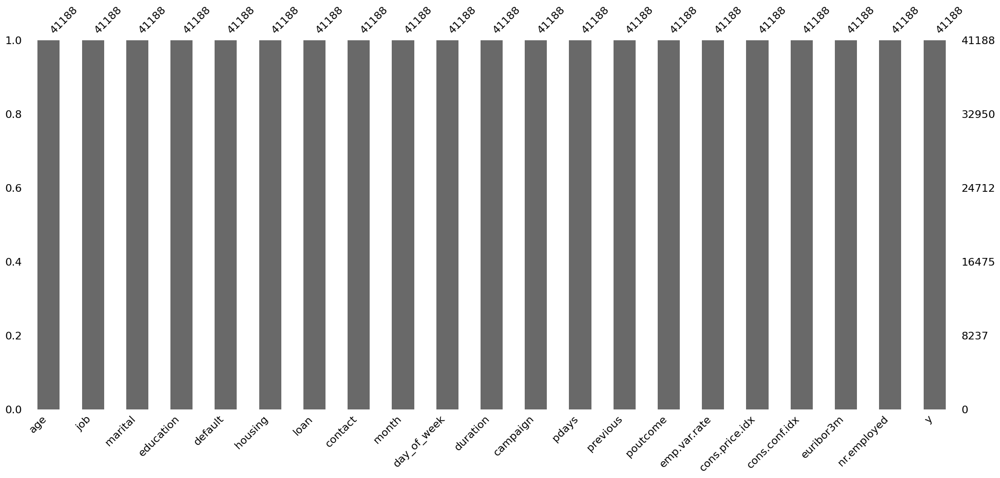

In [7]:
# Visualize the amount of missing values across the dataset features
msno.bar(df);

<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
<b>Observation:</b> There appear to be no missing values, but this is misleading. The data description noted there were a number of missing values that were filled with "unknown". So we need to find out how many have this value.
</div>

### Count the Unknown Values

In [8]:
# Count the number of 'unknown' values in each object column
object_cols = df.select_dtypes(include='object').columns
for col in object_cols:
    unknown_count = (df[col] == 'unknown').sum()
    unknown_percent = unknown_count / len(df) * 100
    print(f"{col}: {unknown_count} ({unknown_percent:.2f}%)")

job: 330 (0.80%)
marital: 80 (0.19%)
education: 1731 (4.20%)
default: 8597 (20.87%)
housing: 990 (2.40%)
loan: 990 (2.40%)
contact: 0 (0.00%)
month: 0 (0.00%)
day_of_week: 0 (0.00%)
poutcome: 0 (0.00%)
y: 0 (0.00%)


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
    <b>Observation:</b> Now we can see there are <b>6 fields with missing values</b> filed as 'unknown', and <b>default</b> is the largest one with 8,597 missing values, which is 20.87% of the dataset. However, as noted, this could just be treated as a category. So we will try that approach and leave the data as is for now.
</div>

### Check for Zero Values

In [9]:
# Count the number of '0' values in each column, only show those greater than '0'
print(df.eq(0).sum().loc[lambda x: x > 0])
print(f"\n{df['previous'].eq(0).sum() / len(df) * 100:.2f}% of 'previous' values are 0")

duration        4
pdays          15
previous    35563
dtype: int64

86.34% of 'previous' values are 0


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
    <b>Observation:</b> Three fields have zero values, but <b>previous</b> has 35,563 zero values, which is <b>86.34%</b> of the dataset. This represents the number of contacts performed for this campaign before the current, so most of the dataset is the initial contact. 
</div>

### Check for Outliers

To check for outliers, I'll look at the descriptive statistics for numerical values with `df.describe`, and look at the maximum and minimum values compared to the quartiles. I'll also run a custom function that looks for outliers based on Tukey's method. Any points that fall below Q1 - 1.5 x IQR or above Q3 + 1.5 x IQR are considered outliers.

#### Examine Descriptive Statistics

In [10]:
# Set dataframe output to not show scientific notation
pd.set_option('display.float_format', '{:.2f}'.format)

In [11]:
# Look for extreme outliers in the quantitative data
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00,41188.00,41188.00,41188.00,41188.00,41188.00,41188.00,41188.00,41188.00,41188.00
mean,40.02,258.29,2.57,962.48,0.17,0.08,93.58,-40.50,3.62,5167.04
std,10.42,259.28,2.77,186.91,0.49,1.57,0.58,4.63,1.73,72.25
min,17.00,0.00,1.00,0.00,0.00,-3.40,92.20,-50.80,0.63,4963.60
25%,32.00,102.00,1.00,999.00,0.00,-1.80,93.08,-42.70,1.34,5099.10
50%,38.00,180.00,2.00,999.00,0.00,1.10,93.75,-41.80,4.86,5191.00
75%,47.00,319.00,3.00,999.00,0.00,1.40,93.99,-36.40,4.96,5228.10
max,98.00,4918.00,56.00,999.00,7.00,1.40,94.77,-26.90,5.04,5228.10


#### Detect Outliers based on IQR

In [12]:
num_columns = [col for col in df.columns if df[col].dtype in ['int64', 'float64']]

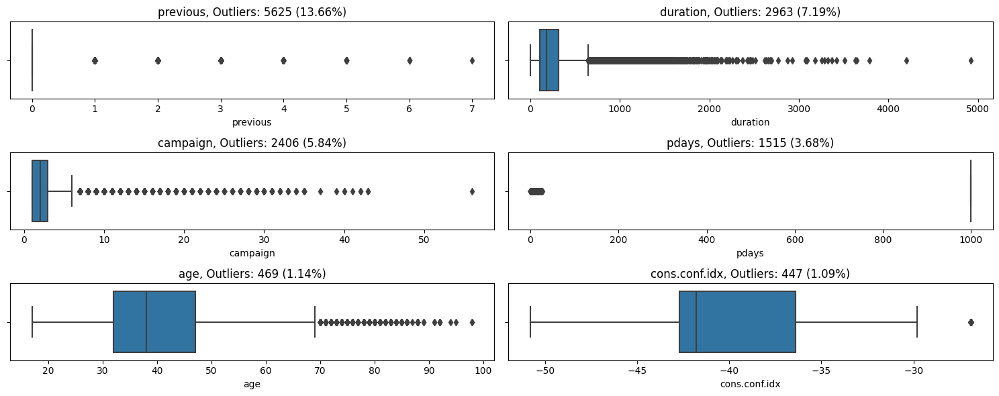

In [13]:
outliers_df = my.detect_outliers(df, num_columns, plot=True, width=15, height=1)

In [14]:
outliers_df

,Column,Total Non-Null,Total Zero,Zero Percent,Outlier Count,Outlier Percent,Skewness,Kurtosis
4,previous,41188,35563,86.34,5625,13.66,3.83,20.11
1,duration,41188,4,0.01,2963,7.19,3.26,20.25
2,campaign,41188,0,0.00,2406,5.84,4.76,36.98
3,pdays,41188,15,0.04,1515,3.68,-4.92,22.23
0,age,41188,0,0.00,469,1.14,0.78,0.79
5,cons.conf.idx,41188,0,0.00,447,1.09,0.30,-0.36


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
<b>Observation:</b> There are a few fields that have a significant number of outliers:
    <ul>
        <li><b>previous</b> has the most outliers (5,625) and outlier percentage (13.66%), but this could be due to the large number of zero values. It is highly skewed with a long tail to the right.
        <li><b>duration</b> (2,963 outliers, 7.19%) and <b>campaign</b> (2,406 outliers, 5.84%) are also highly skewed with a long tail to the right.
        <li><b>pdays</b> (1,515 outliers, 3.68%) is highly skewed, but with a long tail to the left. But we know from the data description that "999" was used to represent someone that was not previously contacted. That explains the odd distribution in the box plot. This value will have to be addressed somehow.
    </ul>
    
We may be able to apply log transformation to get these closer to a normal distribution for machine learning.
</div>

### Look at Unique Values

Let's take a closer look at the values of each variable. To start, I run `df.unique` to find the number of unique values for each variable. This gives me clues to which ones are categorical vs. continuous numerical. I then use a custom helper function called `my.get_unique` ([GitHub](https://github.com/jbeno/mytools/tree/main)) that iterates through each variable that has a unique value count below a specified threshold. It then displays the unique values indented in plain text.

In [15]:
# Assemble the unique counts with the data types and null counts for greater insight
unique_counts = df.nunique(axis=0)
dtypes = df.dtypes
null_percent = (df.isna().sum() / len(df)) * 100
unique_dtypes_df = pd.DataFrame({'Unique Values': unique_counts,'Dtype': dtypes,'% Null': null_percent}).sort_values(by='Unique Values', ascending=False)

In [16]:
# Get a count of unique values for each variable
unique_dtypes_df

,Unique Values,Dtype,% Null
duration,1544,int64,0.00
euribor3m,316,float64,0.00
age,78,int64,0.00
campaign,42,int64,0.00
pdays,27,int64,0.00
cons.conf.idx,26,float64,0.00
cons.price.idx,26,float64,0.00
job,12,object,0.00
nr.employed,11,float64,0.00
month,10,object,0.00


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
    <b>Observation:</b> It looks like <b>job</b> may be the largest categorical variable with 12 unique values. Above this level, everything appears to be numeric. However, there are a few numeric values below this level.
</div>

#### Unique Value Details

In [17]:
# Run my custom helper function to show the unique values of each variable
my.get_unique(df, 12, count=True, percent=True)


CATEGORICAL: Variables with unique values equal to or below: 12

job has 12 unique values:

	admin.              10422   25.3%
	blue-collar         9254    22.47%
	technician          6743    16.37%
	services            3969    9.64%
	management          2924    7.1%
	retired             1720    4.18%
	entrepreneur        1456    3.54%
	self-employed       1421    3.45%
	housemaid           1060    2.57%
	unemployed          1014    2.46%
	student             875     2.12%
	unknown             330     0.8%

marital has 4 unique values:

	married        24928   60.52%
	single         11568   28.09%
	divorced       4612    11.2%
	unknown        80      0.19%

education has 8 unique values:

	university.degree         12168   29.54%
	high.school               9515    23.1%
	basic.9y                  6045    14.68%
	professional.course       5243    12.73%
	basic.4y                  4176    10.14%
	basic.6y                  2292    5.56%
	unknown                   1731    4.2%
	illiterate

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
    <b>Insight:</b> We're starting to learn some things about the <b>clients</b> in this dataset:
    <ul>
        <li>For their occupation, most were <b>admin</b> (25.3%) or <b>blue collar</b> (22.47%).
        <li>The majority of the clients were <b>married</b> (60.52%).
        <li>For education, most had either a <b>university degree</b> (29.54%) or completed <b>high school</b> (23.1%)
        <li>Most had <b>no personal loan</b> (82.43%), but did have a <b>housing loan</b> (52.38%).
        <li>Most had <b>no default</b> (79.12%) on their credit.            
    </ul>

We've also learned some things about how they were contacted by phone as part of this <b>campaign</b>:
    <ul>
        <li>The majority were contacted <b>for the first time</b> (86.34%) and did not have a prior campaign outcome.
        <li>Most were contacted <b>during Summer</b>: May (33.43%), June (12.91%), July (17.42%), August (15%). No one was contacted in January or February.
        <li>The <b>days of the week were evenly distributed</b> between 19-21% each.
        <li>Most were contacted on their <b>cellphone</b> (63.47%)
        <li>The majority <b>declined the offer</b> (88.73%)
    </ul>
</div>

### Check Unique Identifiers

There do not appear to be any unique identifiers other than the index of the dataset.

### Check for Duplicate Records

Without a unique identifier, it's not possible to determine if there are duplicate records.

## Define Column Lists

Since many data processing operations only make sense on numerical vs. categorical features, and we also have to consider our X and y features in mind, let's create lists that we can use later, based on what we've learned so far.

In [18]:
# Create lists of columns we can use later
#
# all_columns
#     x_columns
#         x_num_columns
#         x_cat_columns
#         x_bool_columns
#     y_column
#     num_columns
#     cat_columns
#     bool_columns
#
# Note: If categorical columns are numeric dtypes than convert them to objects/categories or manually specify
# df['column_name'] = df['column_name'].astype('object') # or 'category'
#
all_columns = list(df.columns)
#id_columns = ['id']
x_columns = [col for col in all_columns if col not in ['y']]
x_num_columns = [col for col in x_columns if df[col].dtype in ['int64', 'float64']]
x_cat_columns = [col for col in x_columns if df[col].dtype in ['object', 'category', 'string']]
#x_bool_columns = [col for col in x_columns if df[col].dtype in ['bool']]
y_column = ['y']
num_columns = [col for col in all_columns if df[col].dtype in ['int64', 'float64']]
cat_columns = [col for col in all_columns if df[col].dtype in ['object', 'category', 'string']]
#bool_columns = [col for col in all_columns if df[col].dtype in ['bool']]

## Data Exploration

Next step is to start visualizing some of the data. I like to plot the distributions for all the variables. I created functions called `my.plot_charts` and `my.plot_charts_with_hue` that output Seaborn bar charts or histograms, optionally dimensioned by the target variable.

### Categorical Distributions

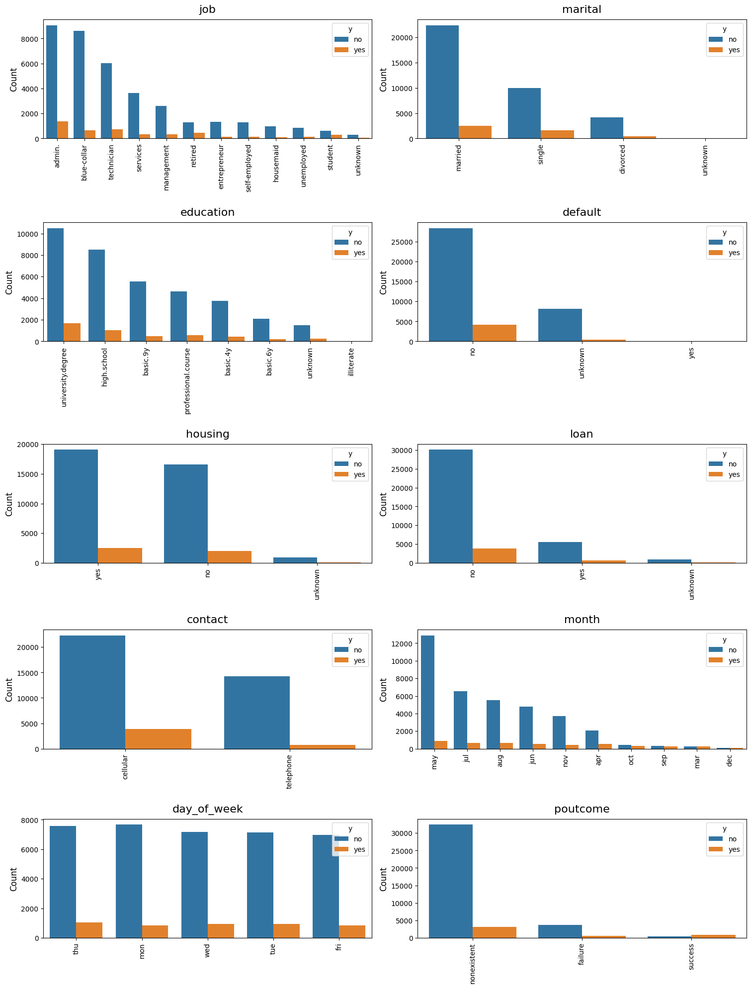

In [19]:
# Plot bar charts of categorical variables, dimensioned by the target variable
my.plot_charts_with_hue(df[cat_columns], plot_type='cat', n=12, hue='y', ncols=2, fig_width=15, rotation=90)

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
    <b>Insight:</b> Visually, it's hard to discern correlation or effect from the charts above. But here's what we can tell. For the most part, the proportion of "no" vs. "yes" in the target variable seems to be consistently distributed (the no's outweigh the yes's by a large majority in each category value). However, there are a few small differences we can see with our eyes:
    <ul>
        <li>A <b>previous successful outcome</b> has more "yes" than "no" values, which breaks the trend, even though the numbers are very small.
        <li>Some months seem to have much less "no" values, which is a dramatic change in proportions, bringing the ratio of yes/no to almost 50/50: <b>October, September, March, December</b>.
        <li>Some occupations seem to have proportionally more "yes" values: <b>Retired, Student</b>.
    </ul>
</div>

### Continuous Distributions

Now we'll look at the continuous variables in histograms, with our variable of interest as a dimension.

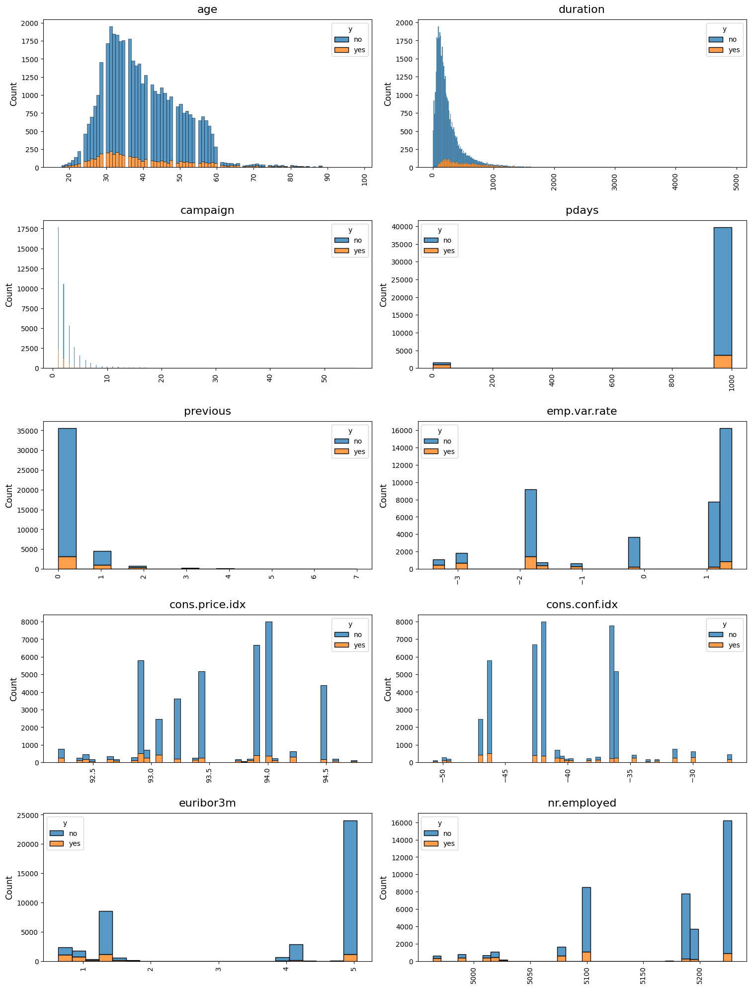

In [20]:
# Plot histograms of continuous variables, dimensioned by the target variable
my.plot_charts_with_hue(df, plot_type='cont', cont_cols=num_columns, hue='y', multiple='stack', ncols=2, fig_width=15, rotation=90)

<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
<b>Observation:</b> We have some non-normal distributions, as we've already noted in our outlier investigation. Some of these numeric values are not continuous, they're discrete, or perhaps some could even be seen as categorical. Nothing stands out as far as the target variable here, but there are some parts of the distributions that have much less "no" values, which might give a little bit of a correlation. We'll have to see.
</div>

## Data Quality Plan

Here is the summary of the issues we discoverd, and our plan to adress them.

### Data Cleaning

1. **Biased Variables:** Duration is intertwined with the y variable, as noted in the data description. So we need to drop this, even though it will have high correlation with the target.
    1. **duration**
        1. ~~Drop 'duration'~~ Note: We will keep 'duration' in this study for benchmarking purposes with the original research paper.
1. **'Unknown' Values:** Missing values were encoded as 'unknown' in this dataset, which is why there are no null or NaN values.
    1. **job:** 330 unknown (0.80%)
        1. Keep 'unknown' and treat as categorical value
    1. **marital:** 80 unknown (0.19%)
        1. Keep 'unknown' and treat as categorical value
    1. **education:** 1731 unknown (4.20%)
        1. Keep 'unknown' and treat as categorical value
    1. **default:** 8597 unknown (20.87%)
        1. Keep 'unknown' and **drop 'yes'** to encode 'default' as a binary value (yes had only 3 records)
        1. Rename 'default' to 'no_default' (1 = 'no', 0 = 'unknown')
    1. **housing:** 990 unknonwn (2.40%)
        1. **Drop 'unknown'** to encode 'housing' as a binary variable
    1. **loan:** 990 unknown (2.40%)
        1. **Drop 'unknown'** to encode 'loan' as a binary value
1. **'999' Values:** pdays had 'not previously contacted' encoded as '999'. 
    1. **pdays**
        1. Create new binary column 'previously_contacted' and put '0' for all those with '999'
        1. Replace '999' with '0'

### Data Encoding

1. **Categorical Variables:** There are a few categorical variables with nominal values in this dataset. We will encode them with One-Hot Encoding:
    1. **job:** 12 values
        1. One-Hot Encode (OHE) 'job'
    1. **marital:** 4 values 
        1. One-Hot Encode (OHE) 'marital'
    1. **education:** 8 values
        1. One-Hot Encode (OHE) 'education'
    1. **no_default:** 2 values after dropping 'yes' in original 'default' column
        1. One-Hot Encode (OHE) 'no_default' with drop='if_binary'
    1. **housing:** 3 values
        1. One-Hot Encode (OHE) 'housing'
    1. **loan:** 3 values
        1. One-Hot Encode (OHE) 'loan'
    1. **contact:** 2 values
        1. One-Hot Encode (OHE) 'contact' with drop='if_binary'
    1. **month:** 10 values
        1. One-Hot Encode (OHE) 'month'
    1. **day_of_week:** 5 values
        1. One-Hot Encode (OHE) 'day_of_week'
        1. Note: I may **drop 'day_of_week'** as it appears to have no significant difference in the distributions and proportions of the target variable, it may be a 'non feature'
    1. **poutcome:** 3 values
        1. One-Hot Encode (OHE) 'poutcome'
    1. **y:** 2 values
        1. Rename 'y' to 'subscribed'
        1. Create 'subscribed_enc' with 'yes' mapped to 1, and 'no' mapped to 0

### Data Transformation and Scaling

1. **Skewed Distributions:** Some numeric data is heavily skewed. We'll apply some transformations to get it closer to a normal distribution. Note: We may just do this in the pipeline processing. 
    1. **campaign**
        1. Experiment with log(1+x) transformation in pipelines with np.log1p (can be reversed with np.expm1)
    1. **pdays**
        1. Experiment with log(1+x) transformation in pipelines with np.log1p (can be reversed with np.expm1)
1. **Different Scales and Negative Values** – The numeric values have different scales and negative values, so we will need to standardize them so the larger values don't dominate the model.
    1. Apply Standard Scaler in pipelines

# Data Preparation

Now we will execute on our plan to address the data quality issues. Let's start by creating a copy of the dataset for data cleaning.

## Data Cleaning

In [21]:
# Create copy of dataset for cleaning
df_clean = pd.DataFrame.copy(df)

### Biased Variables

In [22]:
# Drop 'duration' which is intertwined with y variable
#df_clean.drop(columns='duration', inplace=True)

### Unknown Values

In [23]:
# Drop the 3 'yes' values of 'default'
df_clean = df_clean[df_clean['default'] != 'yes']

In [24]:
# Convert 'default' to 'no_default' with binary encoding
no_default_map = {'no' : 1, 'unknown' : 0}
df_clean = df_clean.rename(columns={'default' : 'no_default'})
df_clean['no_default'] = df_clean['no_default'].map(no_default_map)

In [25]:
# Drop the 'unknown' values of 'housing' and 'loan'
df_clean = df_clean.query("(housing != 'unknown') or (loan != 'unknown')")

### 999 Values

In [26]:
# Create new binary column 'previously_contacted' and put '0' for all those with '999'
df_clean.loc[:, 'previously_contacted'] = df_clean['pdays'].apply(lambda x : 0 if x == 999 else 1)

In [27]:
# Convert all '999' values to '0' in 'pdays'
df_clean.loc[:, 'pdays'] = df_clean['pdays'].apply(lambda x : 0 if x == 999 else x)

### Log Transformation

In [28]:
# Log transform the data that was heavily skewed
#df_clean[['duration_log','campaign_log','pdays_log']] = np.log1p(df_clean[['duration','campaign','pdays']])
#df_clean.drop(columns=['duration', 'campaign', 'pdays'], inplace=True)

### y Variable

In [29]:
# Rename 'y' to 'subscribed'
df_clean['subscribed'] = df_clean['y']
df_clean.drop(columns='y', inplace=True)

# Create 'subscribed_enc' with 'yes' mapped to 1, 'no' mapped to 0
df_clean['subscribed_enc'] = df_clean['subscribed'].apply(lambda x : 1 if x == 'yes' else 0)

### Clean Up the Index

In [30]:
# Reset the index since we dropped a bunch of rows
df_clean = df_clean.reset_index(drop=True)

In [31]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40195 entries, 0 to 40194
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   40195 non-null  int64  
 1   job                   40195 non-null  object 
 2   marital               40195 non-null  object 
 3   education             40195 non-null  object 
 4   no_default            40195 non-null  int64  
 5   housing               40195 non-null  object 
 6   loan                  40195 non-null  object 
 7   contact               40195 non-null  object 
 8   month                 40195 non-null  object 
 9   day_of_week           40195 non-null  object 
 10  duration              40195 non-null  int64  
 11  campaign              40195 non-null  int64  
 12  pdays                 40195 non-null  int64  
 13  previous              40195 non-null  int64  
 14  poutcome              40195 non-null  object 
 15  emp.var.rate       

### Results of Data Cleaning

In [32]:
# Evaluate impact on data set
data_retention = len(df_clean) / len(df) * 100
print(f"Amount of original data set retained after cleaning: {data_retention:.2f}%")

Amount of original data set retained after cleaning: 97.59%


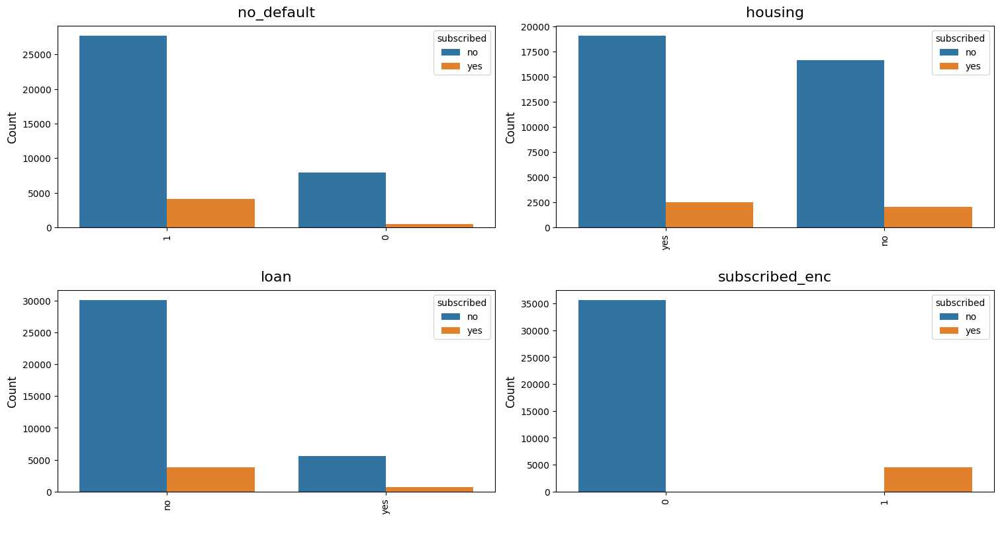

In [33]:
# Plot bar charts of categorical variables, dimensioned by the target variable
my.plot_charts_with_hue(df_clean, plot_type='cat', cat_cols=['no_default','housing','loan','subscribed_enc'], hue='subscribed', ncols=2, fig_width=15, rotation=90)

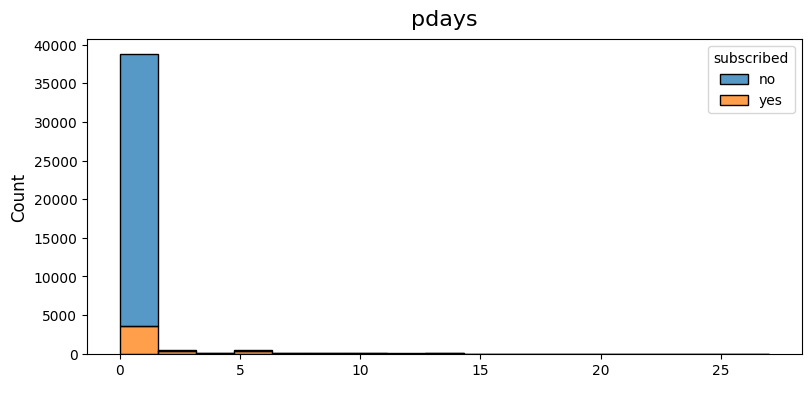

In [34]:
# Plot histograms of continuous variables, dimensioned by the target variable
my.plot_charts_with_hue(df_clean, plot_type='cont', cont_cols=['pdays'], hue='subscribed', multiple='stack', ncols=1, fig_width=8, subplot_height=4, rotation=0)

<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
    <b>Observation:</b> We now have 3 binary features (no_default, housing, loan), which will simplify encoding. The 'y' target variable has been clarified by giving it a meaningful name: 'subscribed'. And we also created an encoded version of this: 'subscribed_enc'. On the numeric side, 'pdays' does not have an extreme outlier at '999' (although it has shifted to a large number of '0' values, but at least it doesn't affect the numerical range).
</div>

## Data Encoding

Now let's encode some features in preparation for the modeling.

### One-Hot Encoding

We'll now encode the categorical variables as described in our Data Quality Plan. These will be encoded during pipelines while modeling, but I will encode them here for correlation analysis.

In [35]:
# Create list of remaining categorical columns to one-hot encode
ohe_columns = ['job','marital','education','no_default','housing','loan','contact','month','day_of_week','poutcome']
ohe_mult_columns = ['job','marital','education','month','day_of_week','poutcome']
ohe_bin_columns = ['no_default','housing','loan','contact']

In [36]:
# Create new dataframe using pd.get_dummies to encode categorical values into separate columns
df_enc = pd.get_dummies(df_clean, columns=ohe_mult_columns, dtype='int', drop_first=False)
df_enc = pd.get_dummies(df_enc, columns=ohe_bin_columns, dtype='int', drop_first=True)

In [37]:
df_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40195 entries, 0 to 40194
Data columns (total 59 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            40195 non-null  int64  
 1   duration                       40195 non-null  int64  
 2   campaign                       40195 non-null  int64  
 3   pdays                          40195 non-null  int64  
 4   previous                       40195 non-null  int64  
 5   emp.var.rate                   40195 non-null  float64
 6   cons.price.idx                 40195 non-null  float64
 7   cons.conf.idx                  40195 non-null  float64
 8   euribor3m                      40195 non-null  float64
 9   nr.employed                    40195 non-null  float64
 10  previously_contacted           40195 non-null  int64  
 11  subscribed                     40195 non-null  object 
 12  subscribed_enc                 40195 non-null 

### Sanity Check

To make sure everything was transformed correctly, need to check for any nulls or NaNs in each column by using `df.isna().sum()`. Then I'll do a sanity check by looking at some rows from the new dataframe (first, last, and a random sample using `df.sample()`. 

In [38]:
# Double-check for any nulls/NaNs as a result of our transformations or encodings
df_enc.isna().sum().loc[lambda x: x > 0]

Series([], dtype: int64)

In [39]:
#df_enc[:10]
#df_enc[-10:]
df_enc.sample(10)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,previously_contacted,subscribed,subscribed_enc,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,marital_unknown,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,no_default_1,housing_yes,loan_yes,contact_telephone
39279,31,350,2,0,0,-1.70,94.22,-40.30,0.89,4991.60,0,yes,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0
20054,46,83,2,0,0,1.40,93.44,-36.10,4.97,5228.10,0,no,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
29564,28,249,1,0,0,-1.80,93.08,-47.10,1.36,5099.10,0,no,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0
34694,46,11,5,0,0,-1.80,92.89,-46.20,1.24,5099.10,0,no,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0
6184,56,196,3,0,0,1.10,93.99,-36.40,4.86,5191.00,0,no,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,1,0,1
13785,24,51,2,0,0,1.40,93.92,-42.70,4.96,5228.10,0,no,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0
22559,48,436,1,0,0,1.40,93.44,-36.10,4.96,5228.10,0,no,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0
2481,36,531,2,0,0,1.10,93.99,-36.40,4.86,5191.00,0,no,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1
22437,38,427,12,0,0,1.40,93.44,-36.10,4.96,5228.10,0,no,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0
7566,49,202,1,0,0,1.40,94.47,-41.80,4.87,5228.10,0,no,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1


## Explore Correlations

### Correlation Matrix

Now that everything is encoded numerically, it's time to look for correlations. I run `df.corr` and round the decimels up to 2. I then plot the correlations using a Seaborn heatmap `sns.heatmap`. I like to use the "RdYlGn" color map with "vmin" set to -1, and "vmax" set to 1. This way the strongest negative correlations are solid red, and the strongest positive correlations are solid green. Everything in the middle is yellow (or orange and light green).

In [40]:
# Create the correlation from the encoded dataset, rounding decimels to 2
corr = round(df_enc.corr(numeric_only=True), 2)

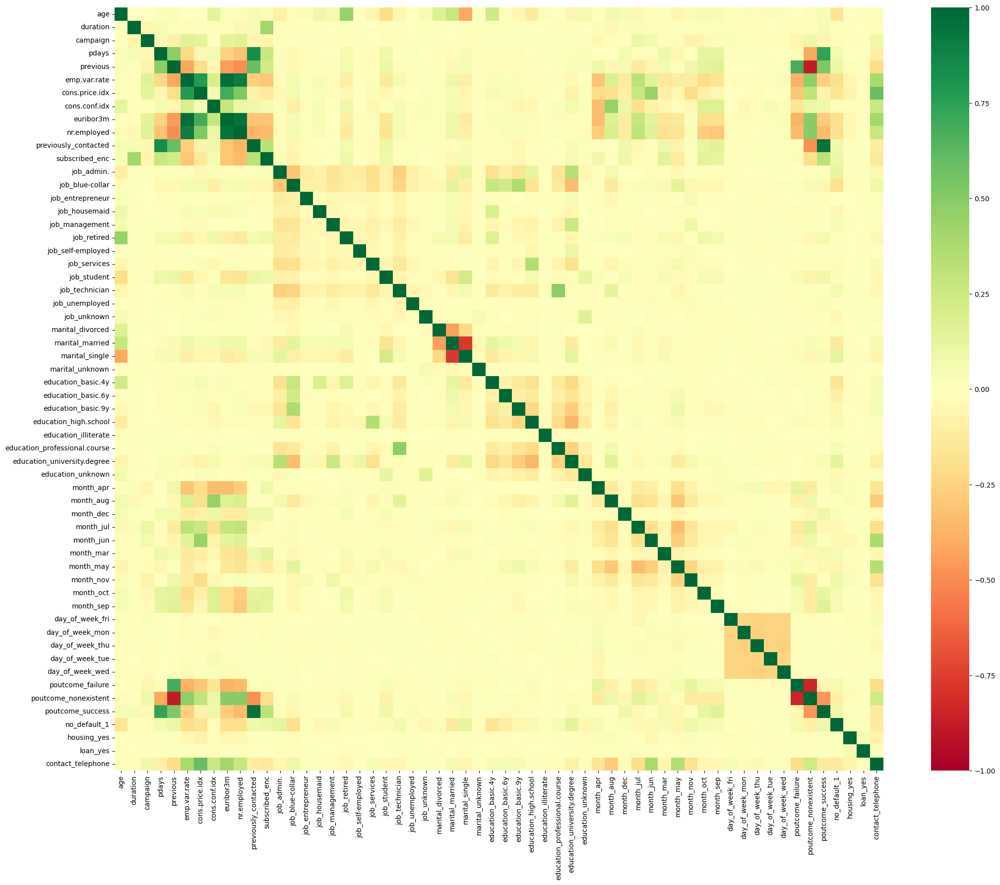

In [41]:
# Plot the correlation using sns.heatmap
plt.figure(figsize=(25, 20))
sns.heatmap(corr, annot=False, cmap="RdYlGn", vmin=-1, vmax=1)
plt.show()

In [42]:
# Show the top positive and negative correlations
my.get_corr(df_enc, n=20)

Top 20 positive correlations:
                       Variable 1            Variable 2  Correlation
0                    emp.var.rate             euribor3m         0.97
1                       euribor3m           nr.employed         0.95
2                poutcome_success  previously_contacted         0.95
3                    emp.var.rate           nr.employed         0.91
4                           pdays  previously_contacted         0.84
5                  cons.price.idx          emp.var.rate         0.78
6                           pdays      poutcome_success         0.74
7                  cons.price.idx             euribor3m         0.69
8                poutcome_failure              previous         0.68
9                        previous  previously_contacted         0.59
10                 cons.price.idx     contact_telephone         0.59
11               poutcome_success              previous         0.52
12                 cons.price.idx           nr.employed         0.52
13  

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
    <b>Insight:</b> We see a number of feature variables that have significant correlations with each other. We could reduce some of these by dropping a value in the multiple categorical variables:
    <ul>
        <li><b>Employment variation rate</b>, <b>Euribor 3-month</b> and <b>number employed</b> are almost perfectly correlated, with correlations of 0.97, 0.95, 0.91, which suggests these financial metrics move together in the same direction.
        <li>Similarly, <b>Consumer price index</b> is strongly correlated with the <b>Employment variation rate</b> (0.78), and <b>Euribor 3-month</b> (0.69), just not as strong as the others
        <li><b>Previous outcome: success</b> and <b>Previously contacted</b> are almost perfectly correlated at 0.95
        <li><b>Days since last contact for previous campaign</b> was strongly correlated with <b>previously contacted</b> (0.84, which makes sense) and <b>previous outcome: success</b> (0.74)
    </ul>
There are a lot of variables that are correlated with each other, which is generally not a good thing. Too many to call out individually here.
</div>

### Individual Correlation Charts

The heatmap matrix is nice to scan broadly for things of interest. But when presenting the correlation results, I didn't find a way to show just one slice of the heatmap (other than cropping a screenshot of it). It seemed like a good idea to summarize the correlations for one variable (against all others) on a bar chart. So I created a function called `my.plot_corr` ([GitHub](https://github.com/jbeno/mytools/tree/main)) that does this.

Every chart is on a fixed y axis from -1 to 1, so visually you can compare/contrast one chart with another to see where there are stronger vs. weaker correlations.

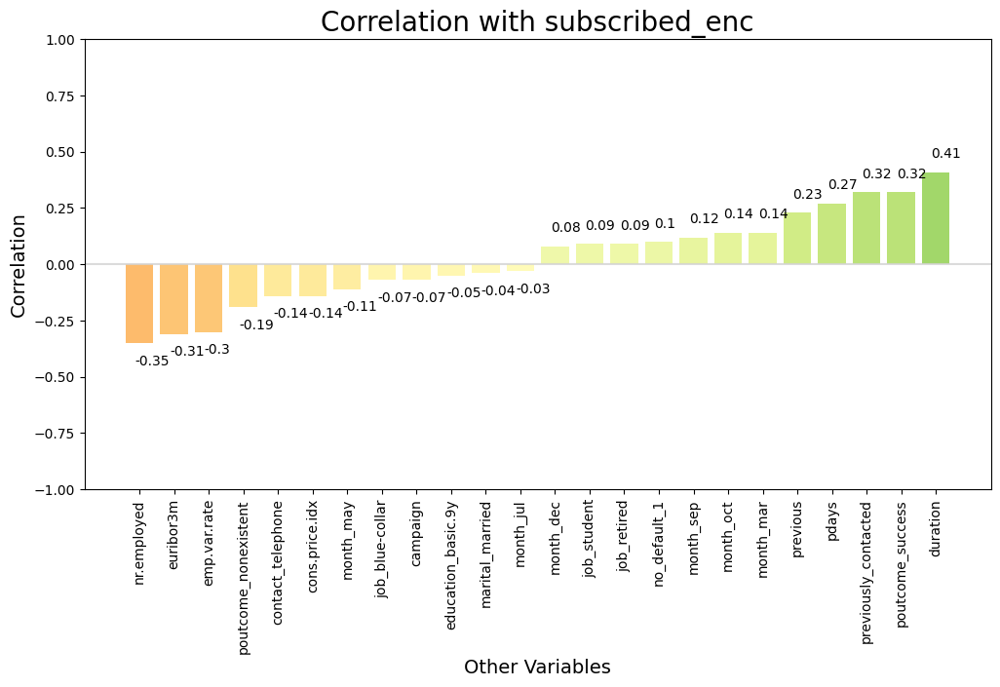

In [288]:
# Use a custom function to plot a chart showing the correlations with one variable
my.plot_corr(df_enc, 'subscribed_enc', n=25, size=(12,6), rot=90)

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
    <b>Insight:</b> We've gained quite a bit of insight from this correlation chart on what factors are associated with clients that subscribe to a deposit vs. those that don't:
    <ul>
        <li><b>Number employed</b> has a moderate negative correlation at -0.35, <b>Euribor 3-month</b> has a moderate negative correlation at -0.31, <b>Employment variation rate</b> has a moderate negative correlation at -0.30, and <b>Consumer price index</b> has a slight negative correlation at -0.14, which suggests that as these macroeconomic factors decrease, subscriptions to deposits tend to increase
        <li><b>Previous outcome: Success</b> has a moderate positive correlation at 0.32. This suggests that a client that previously subscribed has a greater chance of subscribing again in the future.
        <li><b>Previously contacted</b> has moderate positive correlation at 0.32, <b>Days since last contact for previous campaign</b> has a slight positive correlation at 0.27, and <b>Number of previous contacts</b> has a slight positive correlation at 0.23, which suggests that more previous contacts increase the chance that a client will subscribe, and the longer the timeframe after the last contact the better the chances
        <li><b>No previous outcome</b> has a slight negative correlation at -0.19, which is basically in alignment with what we've learneda bout the importance of prior contacts
        <li><b>Contact by telephone</b> has a slight negative correlation at -0.14
        <li>The months of <b>March</b> and <b>October</b> have a slight positive correlation at 0.14, and <b>September</b> has a slight positive correlation at 0.12, so perhaps there's something about that time of the year that makes clients more likely to subscribe. In contrast, <b>May</b> has a slight negative correlation at -0.11, so perhaps that has the opposite effect
        <li><b>No default</b> has a slight positive correlation at 0.1, suggesting those that never had a credit default are slightly more likely to deposit
        <li><b>Students</b> and <b>Retired</b> have a slight positive correlation at 0.09, suggesting those clients are more likely to subscribe. In contrast, <b>Blue Collar</b> workers have a slight negative correlation at -0.11.
    </ul>
</div>

In [44]:
# Get the top positive and negative correlations
pos_features, neg_features = my.get_corr(df_enc, n=15, var='subscribed_enc', return_arrays=True)

Top 15 positive correlations:
              Variable 1      Variable 2  Correlation
0               duration  subscribed_enc         0.41
1       poutcome_success  subscribed_enc         0.32
2   previously_contacted  subscribed_enc         0.32
3                  pdays  subscribed_enc         0.27
4               previous  subscribed_enc         0.23
5              month_mar  subscribed_enc         0.14
6              month_oct  subscribed_enc         0.14
7              month_sep  subscribed_enc         0.12
8           no_default_1  subscribed_enc         0.10
9            job_student  subscribed_enc         0.09
10           job_retired  subscribed_enc         0.09
11             month_dec  subscribed_enc         0.08
12             month_apr  subscribed_enc         0.08
13         cons.conf.idx  subscribed_enc         0.06
14        marital_single  subscribed_enc         0.05

Top 15 negative correlations:
              Variable 1      Variable 2  Correlation
0            nr.emplo

### Create Dataframe of Top Correlated Features

In [45]:
print("Top positive correlation features:\n", pos_features)
print("\nTop negative correlation features:\n", neg_features)

Top positive correlation features:
 ['duration' 'poutcome_success' 'previously_contacted' 'pdays' 'previous'
 'month_mar' 'month_oct' 'month_sep' 'no_default_1' 'job_student'
 'job_retired' 'month_dec' 'month_apr' 'cons.conf.idx' 'marital_single']

Top negative correlation features:
 ['nr.employed' 'euribor3m' 'emp.var.rate' 'poutcome_nonexistent'
 'contact_telephone' 'cons.price.idx' 'month_may' 'campaign'
 'job_blue-collar' 'education_basic.9y' 'marital_married' 'month_jul'
 'job_services' 'job_entrepreneur' 'day_of_week_mon']


In [46]:
# Combine them together and add the target variable
top_features = np.concatenate((pos_features, neg_features))
top_features = np.concatenate((top_features, ['subscribed_enc']))

In [47]:
# Create a dataframe with just these columns
df_top_features = pd.DataFrame.copy(df_enc[top_features])

In [48]:
df_top_features

,duration,poutcome_success,previously_contacted,pdays,previous,month_mar,month_oct,month_sep,no_default_1,job_student,job_retired,month_dec,month_apr,cons.conf.idx,marital_single,nr.employed,euribor3m,emp.var.rate,poutcome_nonexistent,contact_telephone,cons.price.idx,month_may,campaign,job_blue-collar,education_basic.9y,marital_married,month_jul,job_services,job_entrepreneur,day_of_week_mon,subscribed_enc
0,261,0,0,0,0,0,0,0,1,0,0,0,0,-36.40,0,5191.00,4.86,1.10,1,1,93.99,1,1,0,0,1,0,0,0,1,0
1,149,0,0,0,0,0,0,0,0,0,0,0,0,-36.40,0,5191.00,4.86,1.10,1,1,93.99,1,1,0,0,1,0,1,0,1,0
2,226,0,0,0,0,0,0,0,1,0,0,0,0,-36.40,0,5191.00,4.86,1.10,1,1,93.99,1,1,0,0,1,0,1,0,1,0
3,151,0,0,0,0,0,0,0,1,0,0,0,0,-36.40,0,5191.00,4.86,1.10,1,1,93.99,1,1,0,0,1,0,0,0,1,0
4,307,0,0,0,0,0,0,0,1,0,0,0,0,-36.40,0,5191.00,4.86,1.10,1,1,93.99,1,1,0,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40190,334,0,0,0,0,0,0,0,1,0,1,0,0,-50.80,0,4963.60,1.03,-1.10,1,0,94.77,0,1,0,0,1,0,0,0,0,1
40191,383,0,0,0,0,0,0,0,1,0,0,0,0,-50.80,0,4963.60,1.03,-1.10,1,0,94.77,0,1,1,0,1,0,0,0,0,0
40192,189,0,0,0,0,0,0,0,1,0,1,0,0,-50.80,0,4963.60,1.03,-1.10,1,0,94.77,0,2,0,0,1,0,0,0,0,0
40193,442,0,0,0,0,0,0,0,1,0,0,0,0,-50.80,0,4963.60,1.03,-1.10,1,0,94.77,0,1,0,0,1,0,0,0,0,1


## Multivariate Charts

The next step is to explore the relationship between different continuous variables in charts to see if we see any linear or nonlinear relationships. We should expect to see some type of linear relationship for those that have a strong correlation above.

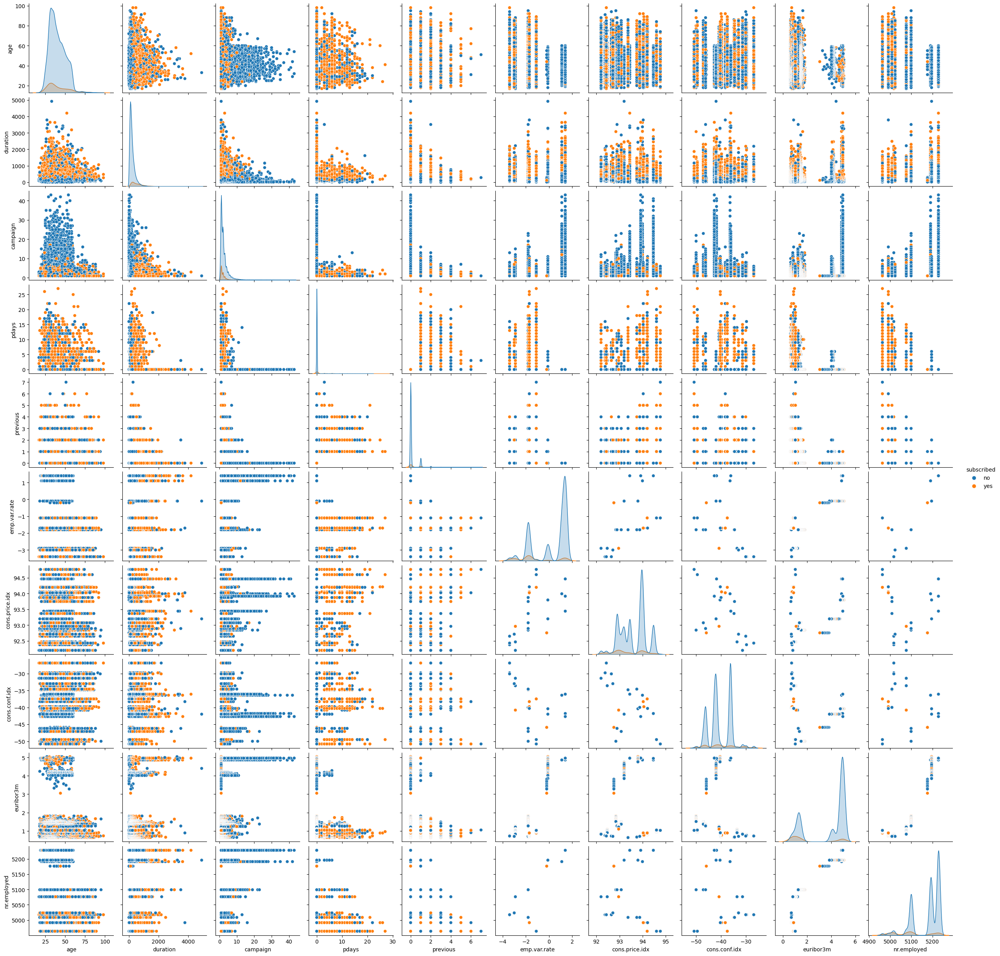

In [49]:
# List of variables to include in the pair plot
vars_to_plot = ['age',
                'duration',
                'campaign',
                'pdays',
                'previous',
                'emp.var.rate',
                'cons.price.idx',
                'cons.conf.idx',
                'euribor3m',
                'nr.employed']

# Create a pairplot with selected variables
sns.pairplot(data=df_clean, vars=vars_to_plot, hue='subscribed')
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> The above charts show numeric variable relationships, colored by the target y variable ('subscribed': yes or no). A few observations can be made:
    <ul>
        <li><b>Euribor 3-month</b> seems to have more subscriptions than on the lower end, and this is most obvious when plotted against 'pdays'. Most of the 'yes' values are in the left cluster of that plot.
        <li><b>Number of campaign contacts</b> seems to have a slight affect on subscriptions, most of the 'yes' values are associated with lower values
        <li>The strong positive correlation we saw for the macroeconomic variables can be seen as a plot with a diagonal shape to the upper right, like <b>Number Employed</b> and <b>Euribor 3-month</b>, or <b>Consumer price index</b> and <b>Employment variation rate</b>
    </ul>
</div>

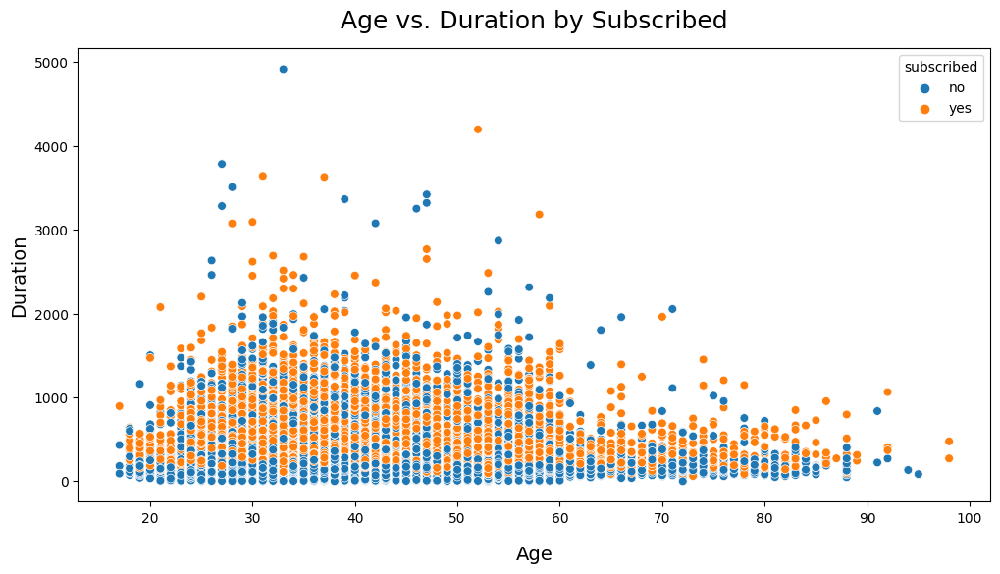

In [50]:
plt.figure(figsize=(12,6))
plt.title('Age vs. Duration by Subscribed', fontsize=18, pad=15)
sns.scatterplot(data=df_clean, x='age', y='duration', hue='subscribed', s=40, alpha=1)
plt.xlabel('Age', fontsize=14, labelpad=15)
plt.ylabel('Duration', fontsize=14)
plt.show()

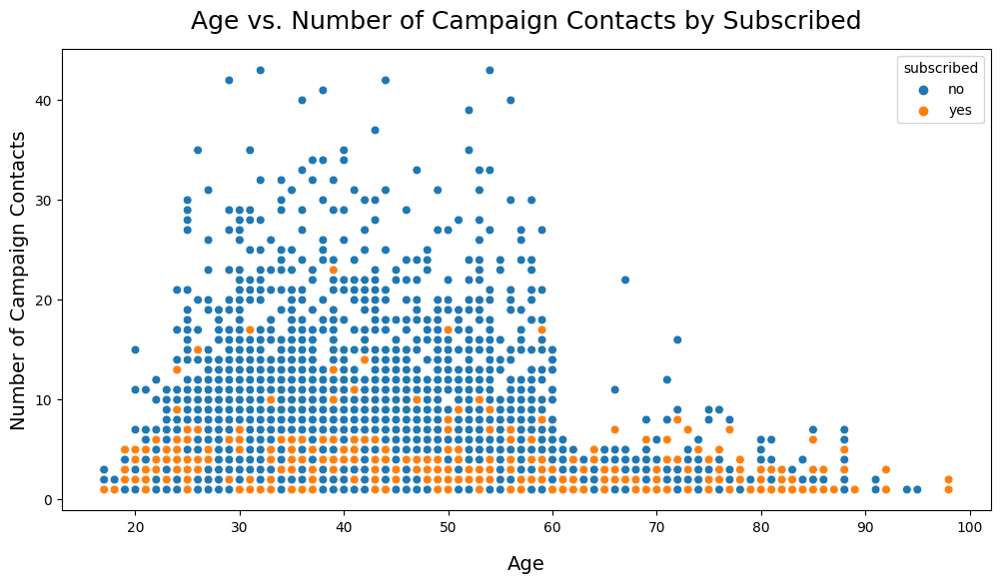

In [51]:
plt.figure(figsize=(12,6))
plt.title('Age vs. Number of Campaign Contacts by Subscribed', fontsize=18, pad=15)
sns.scatterplot(data=df_clean, x='age', y='campaign', hue='subscribed', s=40, alpha=1)
plt.xlabel('Age', fontsize=14, labelpad=15)
plt.ylabel('Number of Campaign Contacts', fontsize=14)
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Number of campaign contacts seems to have an effect on subscriptions, most of the 'yes' values are associated with lower values.
</div>

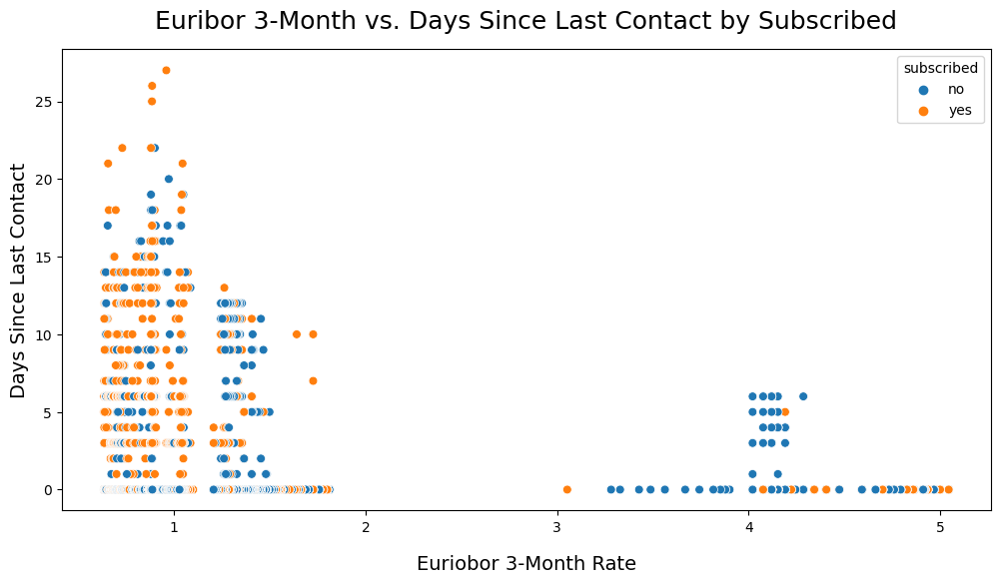

In [52]:
plt.figure(figsize=(12,6))
plt.title('Euribor 3-Month vs. Days Since Last Contact by Subscribed', fontsize=18, pad=15)
sns.scatterplot(data=df_clean, x='euribor3m', y='pdays', hue='subscribed', s=40, alpha=1)
plt.xlabel('Euriobor 3-Month Rate', fontsize=14, labelpad=15)
plt.ylabel('Days Since Last Contact', fontsize=14)
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Euribor 3-month seems to have more subscriptions than on the lower end, and this is most obvious when plotted against 'pdays'. Most of the 'yes' values are in the left cluster of that plot.
</div>

# Model Building and Analysis

Now we will try to create a model that can predict if a customer will subscribe to a term deposit based on the features we've been examining. We'll take an iterative approach with this process.

## Test Design

We will start with a baseline and iterate models with the following approach:

1. **Split Dataset** – We will shuffle and split the dataset into X and y features, in Train/Test sets initially at a 75/25 ratio. We will then explore a range of test sizes from 0.20 to 0.40 to see if we can get better performance without overfitting using a different ratio. Validation will be handled using Cross Validation during modeling as a subset of the Train set.
1. **Establish Baseline** – We'll establish baseline models using two approaches: (a) always select the most frequent class value, which in this case is 'no' or 0, (b) randomly select a class value, which should give us roughly a 50/50 split. We'll calcuate the performance metrics and make sure our model performs better.
1. **Logistic Regression Model** – A more relevant baseline will be established by building a basic Logistic Regression model with defaults.
1. **Handle Imbalanced Data** – We're dealing with an imbalanced dataset. The target variable is split 88% 'no' vs. 11% 'yes', so we need to experiment with a few techniques: (1) adjusting class weights for our models inverse to the current proportions, (2) using SMOTE to oversample the minority class, and (3) using RandomUnderSampler to undersample the majority class. Some or all of these methods should allow the model to learn from the smaller amount of positive class data.
1. **Configure Parameters** – Since we'll be exploring multiple classifiers with differnet hyperparameters, we'll specify a range of parameters for each classifier that will be used by GridSearchCV. 
1. **Search for Best Model** – I'll then use a custom function `my.compare_models` that builds a Pipeline and runs a GridSearchCV looking for the best parameters. We'll use Recall as our search metric to identify the best parameters. This function currently supports basic pipelines with One-Hot Encoding (OHE) and Standard Scaler. If needed, I may manually create additional pipelines, fit and predict, and use `my.eval_model` to evaluate its performance. 
1. **Evaluation** – To evaluate and ultimatley select our best model, we will look at Recall since we are trying to maximize the number of true positives we're trying to detect. We'll also look at the number of False Negatives. We want Recall to be high, False Negatives to be low, and False Negative Rate to be low. Because we are doing binary classification, we have the ability to manipulate the threshold to ensure we're classifying the majority of clients that will subscribe to a term deposit. 

## Data Processing

### Load Libraries

In [53]:
import math
from datetime import datetime
from random import shuffle, seed
from joblib import dump, load
import pytz
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_selection import SequentialFeatureSelector, RFE
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.dummy import DummyClassifier
from imblearn.over_sampling import SMOTE
from scipy import stats

In [54]:
# Setup pipelines to display as diagrams
from sklearn import set_config
set_config(display="diagram")

In [91]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

### Update X and y Columns

Let's update our column mappings since we've dropped some variables and identified our encoding plan.

In [56]:
# Identify the X independent variables and y dependent variable
x_columns = list(df_enc.drop(columns=['subscribed', 'subscribed_enc']).columns)
x_num_columns = [col for col in x_columns if df_enc[col].dtype in ['int64', 'float64']]
x_cat_columns = [col for col in x_columns if df_enc[col].dtype in ['object', 'category', 'string']]
y_column = ['subscribed_enc']

In [57]:
# Review our X and y columns
print("X columns: ", x_columns)
#print("X numeric columns: ", x_num_columns)
#print("X categorical columns: ", x_cat_columns)
print("y column: ", y_column)

X columns:  ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'previously_contacted', 'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired', 'job_self-employed', 'job_services', 'job_student', 'job_technician', 'job_unemployed', 'job_unknown', 'marital_divorced', 'marital_married', 'marital_single', 'marital_unknown', 'education_basic.4y', 'education_basic.6y', 'education_basic.9y', 'education_high.school', 'education_illiterate', 'education_professional.course', 'education_university.degree', 'education_unknown', 'month_apr', 'month_aug', 'month_dec', 'month_jul', 'month_jun', 'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep', 'day_of_week_fri', 'day_of_week_mon', 'day_of_week_thu', 'day_of_week_tue', 'day_of_week_wed', 'poutcome_failure', 'poutcome_nonexistent', 'poutcome_success', 'no_default_1', 'housing_yes', 'loan_yes', 'contact_telephone

### Separate X and Y

Let's separate the X independent variables from the Y dependent variable.

In [58]:
# Separate pre-encoded dataframe into X and y
X = df_enc[x_columns].copy()
y = df_enc[y_column].squeeze()

In [59]:
# Verify X/Y split
#X1.head(), y1.head()
print("X, y shapes: ", X.shape, y.shape)

X, y shapes:  (40195, 57) (40195,)


### Training, Validation and Test Splits

We will split into Train/Test datasets, since cross-validation will handle our Validation set (derived from the Training set).

In [60]:
# Create training and test datasets, if cross-validation strategy derives the validation set from training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=df_enc['subscribed_enc'], random_state=42)

In [61]:
# Verify train/test split
#X_train.info(), X_test.info(), y_train.info(), y_test.info()
print("X_train, y_train, X_test, y_test shapes: ", X_train.shape, X_test.shape, y_train.shape, y_test.shape)

X_train, y_train, X_test, y_test shapes:  (30146, 57) (10049, 57) (30146,) (10049,)


## Baseline Models

Let's create dummy classifiers that will (a) just always choose the most frequent value, or (b) choose random values, as our baselines. We can use these as benchmarks for our final model, which should perform better.

### Most Frequent Baseline

In [62]:
# Creating a dummy classifier
baseline = DummyClassifier(strategy='most_frequent')
baseline.fit(X_train, y_train)

# Make predictions based on the dummy classifier
baseline_pred = baseline.predict(X_test)

In [63]:
# Calculate baseline model metrics
baseline_accuracy = accuracy_score(y_test, baseline_pred)
print(f"Most Frequent Baseline Accuracy: {baseline_accuracy:.4f}")

baseline_precision = precision_score(y_test, baseline_pred, zero_division=0)
print(f"Most Frequent Baseline Precision: {baseline_precision:.4f}")

baseline_recall = recall_score(y_test, baseline_pred)
print(f"Most Frequent Baseline Recall: {baseline_recall:.4f}")

baseline_f1 = f1_score(y_test, baseline_pred)
print(f"Most Frequent Baseline F1: {baseline_f1:.4f}")

baseline_roc_auc = roc_auc_score(y_test, baseline.predict_proba(X_test)[:,1])
print(f"Most Frequent Baseline ROC AUC: {baseline_roc_auc:.4f}")

Most Frequent Baseline Accuracy: 0.8873
Most Frequent Baseline Precision: 0.0000
Most Frequent Baseline Recall: 0.0000
Most Frequent Baseline F1: 0.0000
Most Frequent Baseline ROC AUC: 0.5000


### Random Baseline

In [64]:
# Creating a random dummy classifier
random_baseline = DummyClassifier(strategy='uniform', random_state=42)
random_baseline.fit(X_train, y_train)

# Make predictions based on the random dummy classifier
random_baseline_pred = random_baseline.predict(X_test)

In [65]:
# Calculate random baseline model metrics
random_baseline_accuracy = accuracy_score(y_test, random_baseline_pred)
print(f"Random Baseline Accuracy: {random_baseline_accuracy:.4f}")

random_baseline_precision = precision_score(y_test, random_baseline_pred, zero_division=0)
print(f"Random Baseline Precision: {random_baseline_precision:.4f}")

random_baseline_recall = recall_score(y_test, random_baseline_pred)
print(f"Random Baseline Recall: {random_baseline_recall:.4f}")

random_baseline_f1 = f1_score(y_test, random_baseline_pred)
print(f"Random Baseline F1: {random_baseline_f1:.4f}")

random_baseline_roc_auc = roc_auc_score(y_test, random_baseline.predict_proba(X_test)[:,1])
print(f"Random Baseline ROC AUC: {random_baseline_roc_auc:.4f}")

Random Baseline Accuracy: 0.5025
Random Baseline Precision: 0.1139
Random Baseline Recall: 0.5031
Random Baseline F1: 0.1857
Random Baseline ROC AUC: 0.5000


<div style="background-color: #e8f3ff; border: 1px solid #aecae8; padding: 10px; border-radius: 3px;">
    <b>Observation:</b> From our two baseline models, we have some metrics we know we need to beat:
    <ul>
        <li><b>Accuracy</b> must be better than <b>0.8873</b>
        <li><b>Precision</b> must be better than <b>0.1139</b>
        <li><b>Recall</b> must be better than <b>0.5031</b>
        <li><b>F1</b> must be better than <b>0.1857</b>
        <li><b>ROC AUC</b> must be better than <b>0.5000</b>
    </ul>
</div>

## Logistic Regression Model with Defaults

Let's now create a simple Logistic Regression model with defaults as a more realistic baseline. We'll then follow this up with a more automated search of various hyperparamters to find the best performing model.

### Build a Pipeline

In [66]:
# Create a pipeline with Standard Scaler and Logistic Regression
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(max_iter=10000, random_state=42))
])

### Fit the Data

In [67]:
# Fit the pipeline with the training data
pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(max_iter=10000, random_state=42))])

### Make Predictions

In [68]:
# Make predictions with the test data
y_preds = pipe.predict(X_test)

### Evaluate Model Performance

I will use a custom function to evaluate a classification model's performance. `my.eval_model` takes in y_test, y_preds, X_test, the estimator, and a few parameters to speicfy the negative and positive labels, the threshold, a title, and options for the number of decimal places, and plotting. It then outputs the classification report, true/false positive/negative rates, a Confusion Matrix, Histogram of Predicted Probabilities, ROC Curve, and Precision Recall Curve, both of which highlight the closet point for the chosen threshold.


LogReg Model: T=0.5 Binary Classification Report

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8916
           1       0.67      0.43      0.52      1133

    accuracy                           0.91     10049
   macro avg       0.80      0.70      0.74     10049
weighted avg       0.90      0.91      0.90     10049

ROC AUC:  0.94 

               Predicted:0         1         
Actual: 0                8676      240       
Actual: 1                651       482       

True Positive Rate / Sensitivity: 0.43
True Negative Rate / Specificity: 0.97
False Positive Rate / Fall-out: 0.03
False Negative Rate / Miss Rate: 0.57

Positive Label: 1
Class Weight:  None


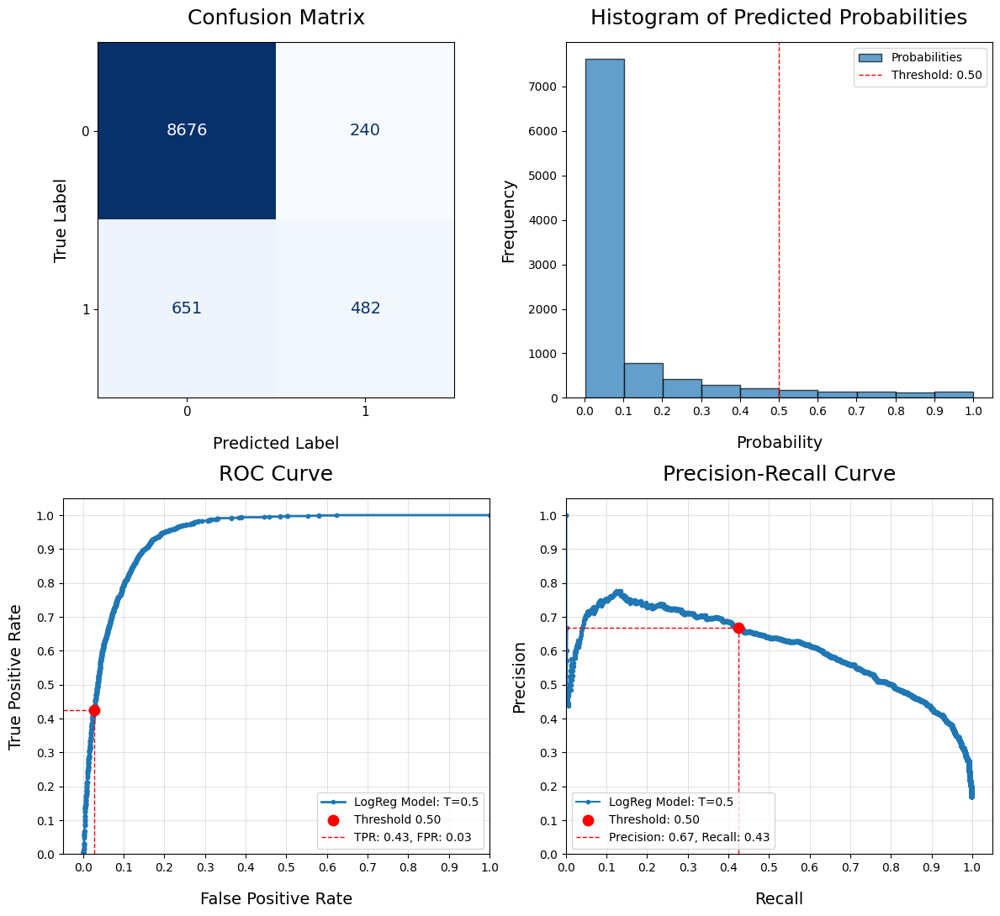

In [69]:
# Evaluate pipeline model with custom function
my.eval_model(y_test=y_test, preds=y_preds, X_test=X_test, estimator=pipe,
                        neg_label=0, pos_label=1,
                        title="LogReg Model: T=0.5", threshold=0.5,
                        decimal=2, plot=True, figsize=(12,11))

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> This basic Logistic Regression model shows some potential, but it's struggling to detect the minority positive class (there is no spike on the right side of the Histogram of Predicted Probabilities). The accuracy score is better than the baseline, but not by much – and accuracy is not what we care about for this use case. It has a good ROC Curve, but the threshold of 0.50 is not in an optimal position to maximize the True Positives. We could try to oversample the minority class, adjust the class weights, and maybe adjust the threshold.
</div>

## Logistic Regression Model with Oversampling and Balanced Weights

Let's see if we can get better performance by oversampling the minority class and adjusting the class weightings.

### Oversample the Minority Class

We'll oversample the minority class using SMOTE. We'll take a conservative approach, and increase it's size to 20% of the size of the majority class.

In [70]:
print("X_train, y_train shapes before: ", X_train.shape, y_train.shape)
print("y_train value counts before: ", y_train.value_counts())

X_train, y_train shapes before:  (30146, 57) (30146,)
y_train value counts before:  subscribed_enc
0    26746
1     3400
Name: count, dtype: int64


In [71]:
# Oversample the minority class using SMOTE
over = SMOTE(sampling_strategy=0.20, random_state=42)
X2_train, y2_train = over.fit_resample(X_train, y_train)
print("X2_train, y2_train shapes after: ", X2_train.shape, y2_train.shape)
print("y2_train value counts after: ", y2_train.value_counts())

X2_train, y2_train shapes after:  (32095, 57) (32095,)
y2_train value counts after:  subscribed_enc
0    26746
1     5349
Name: count, dtype: int64


### Build a New Pipeline with Class Weightings

In [72]:
# Create a pipeline with Standard Scaler and Logistic Regression with class weightings
pipe2 = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42))
])

### Fit the New Data

In [73]:
# Fit the pipeline with the resampled training data
pipe2.fit(X2_train, y2_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    random_state=42))])

### Make Predictions

In [74]:
# Make predictions with the resampled test data
y2_preds = pipe2.predict(X_test)

### Evaluate Model Performance


LogReg Model: W=balanced, SMOTE=0.2, T=0.5 Binary Classification Report

              precision    recall  f1-score   support

           0       0.98      0.89      0.93      8916
           1       0.49      0.83      0.62      1133

    accuracy                           0.88     10049
   macro avg       0.73      0.86      0.77     10049
weighted avg       0.92      0.88      0.90     10049

ROC AUC:  0.94 

               Predicted:0         1         
Actual: 0                7931      985       
Actual: 1                191       942       

True Positive Rate / Sensitivity: 0.83
True Negative Rate / Specificity: 0.89
False Positive Rate / Fall-out: 0.11
False Negative Rate / Miss Rate: 0.17

Positive Label: 1
Class Weight:  None


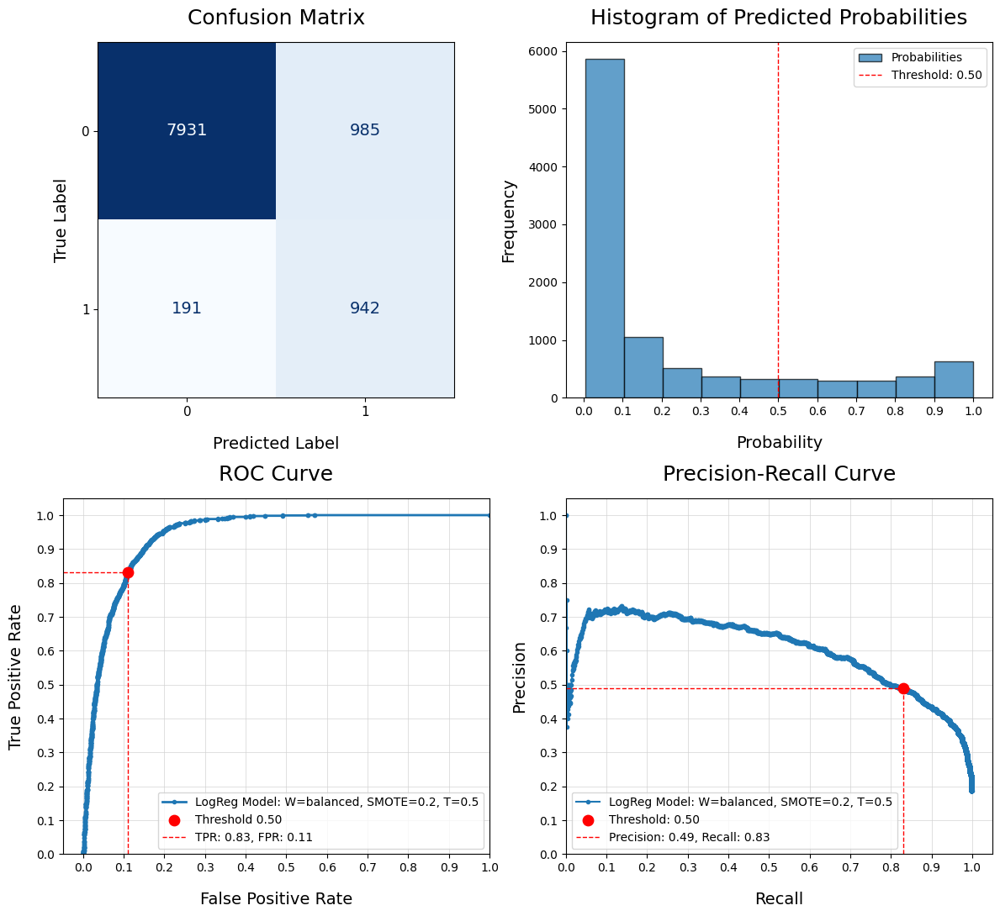

In [75]:
# Evaluate updated pipeline model with custom function
my.eval_model(y_test=y_test, preds=y2_preds, X_test=X_test, estimator=pipe2,
                        neg_label=0, pos_label=1,
                        title="LogReg Model: W=balanced, SMOTE=0.2, T=0.5", threshold=0.5,
                        decimal=2, plot=True, figsize=(12,11))

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> By setting the class_weight to 'balanced' in the Logistic Regression, we got a significant improvement in the model performance. And the oversampling of the minority class from SMOTE helped a little as well. For the positive class, our F1 score went from 0.52 to 0.62, our Recall went from 0.42 to 0.83. However, our Precision went from 0.67 to 0.49. But that's okay for our use case. We're trying to find the clients that are most likely to make a deposit. Every one we find will pay off, so we want to maximize finding them at the risk of some False Positives. With default settings, we missed 651 clients that would've deposited, a False Negative Rate of 0.57, which is very poor. But in this revised model, <b>we only missed 191 clients</b> for a False Negative Rate of 0.17 – that's a huge improvement. I'm tempted to adjust the threshold to capture even more, but I don't like having a Precision lower than 0.50, so we will leave it as is.
</div>

## Model Iteration

Now that we've done some basic modeling and made adjustments for the imbalanced class, let's see if we can broaden our search for the best model by evaluating different types of models, and a variety of hyperparamters for each of them. We will look at the following 4 models and their associated hyperparameters:

* **Logistic Regression** - C, Solver
* **Decision Tree Classifier** – Max Depth, Min Samples Split, Criterion, Min Samples Leaf
* **K-Nearest Neighbors Classifier** - N Neighbors, Weights, Metric
* **Support Vector Machines** - C, Kernel

Let's start off by comparing the 4 different models, building on what we've done previously: class weights will be balanced, and the minority class will be oversampled. I'll use a custom function I wrote called `my.compare_models` that takes as input: X, y, test_size, a list of models and parameters for searching, the search type, and a variety of other options. It can also call `my.eval_model` to evaluate the best model after each search.

### Configure Search Parameters

In [238]:
# Identify classification models to evaluate
models = [LogisticRegression, DecisionTreeClassifier, KNeighborsClassifier, SVC]

# Configure parameters for grid search of model hyperparameters
params = {
    'logreg': {
        'logreg__C': [0.01, 0.1, 1, 10, 100, 1000],
        'logreg__solver': ['newton-cg', 'lbfgs']
    },
    'tree': {
        'tree__max_depth': [3, 4, 5, 6, 7],
        'tree__min_samples_split': [10, 20, 40],
        'tree__criterion': ['gini', 'entropy'],
        'tree__min_samples_leaf': [2, 4, 6]
    },
    'knn': {
        'knn__n_neighbors': [3, 5, 10, 15],
        'knn__weights': ['uniform', 'distance'],
        'knn__metric': ['euclidean', 'manhattan']
    },
    'svm': {
        'svm__C': [0.1, 1, 10, 100],
        'svm__kernel': ['linear', 'poly', 'rbf']
    }
}

### Search and Evaluate Best Models (Recall)


-----------------------------------------------------------------------------------------
Starting Data Processing - Oct 15, 2023 11:50 AM PST
-----------------------------------------------------------------------------------------

Train/Test split, test_size:  0.25
X_train, X_test, y_train, y_test shapes:  (30146, 57) (10049, 57) (30146,) (10049,)

Oversampling via SMOTE strategy:  0.2
X_train, y_train shapes before:  (30146, 57) (30146,)
y_train value counts before:  subscribed_enc
0    26746
1     3400
Name: count, dtype: int64
Running SMOTE on X_train, y_train...
X_train, y_train shapes after:  (32095, 57) (32095,)
y_train value counts after:  subscribed_enc
0    26746
1     5349
Name: count, dtype: int64

-----------------------------------------------------------------------------------------
1/4: Starting LogisticRegression Random Search - Oct 15, 2023 11:50 AM PST
-----------------------------------------------------------------------------------------

Fitting 5 folds for e

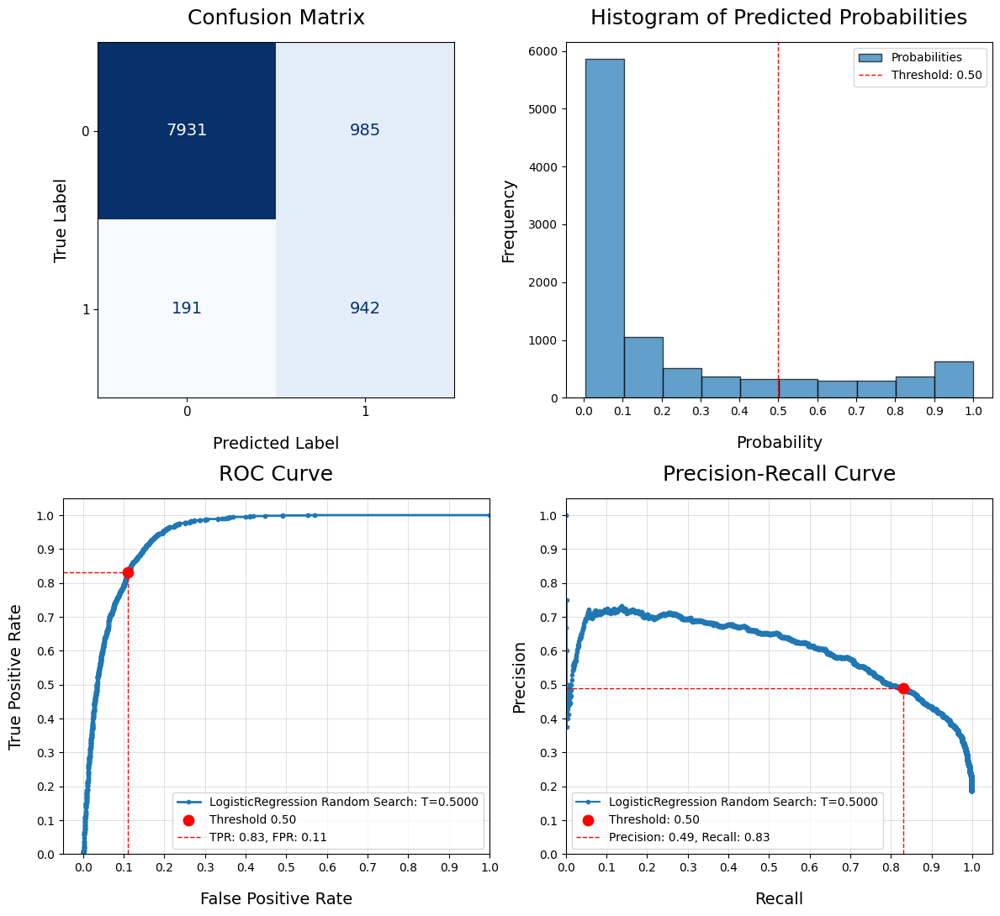


-----------------------------------------------------------------------------------------
2/4: Starting DecisionTreeClassifier Random Search - Oct 15, 2023 11:51 AM PST
-----------------------------------------------------------------------------------------

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.885 total time=   0.1s
[CV 2/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.866 total time=   0.1s
[CV 3/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.891 total time=   0.1s
[CV 4/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.958 total time=   0.1s
[CV 5/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.9

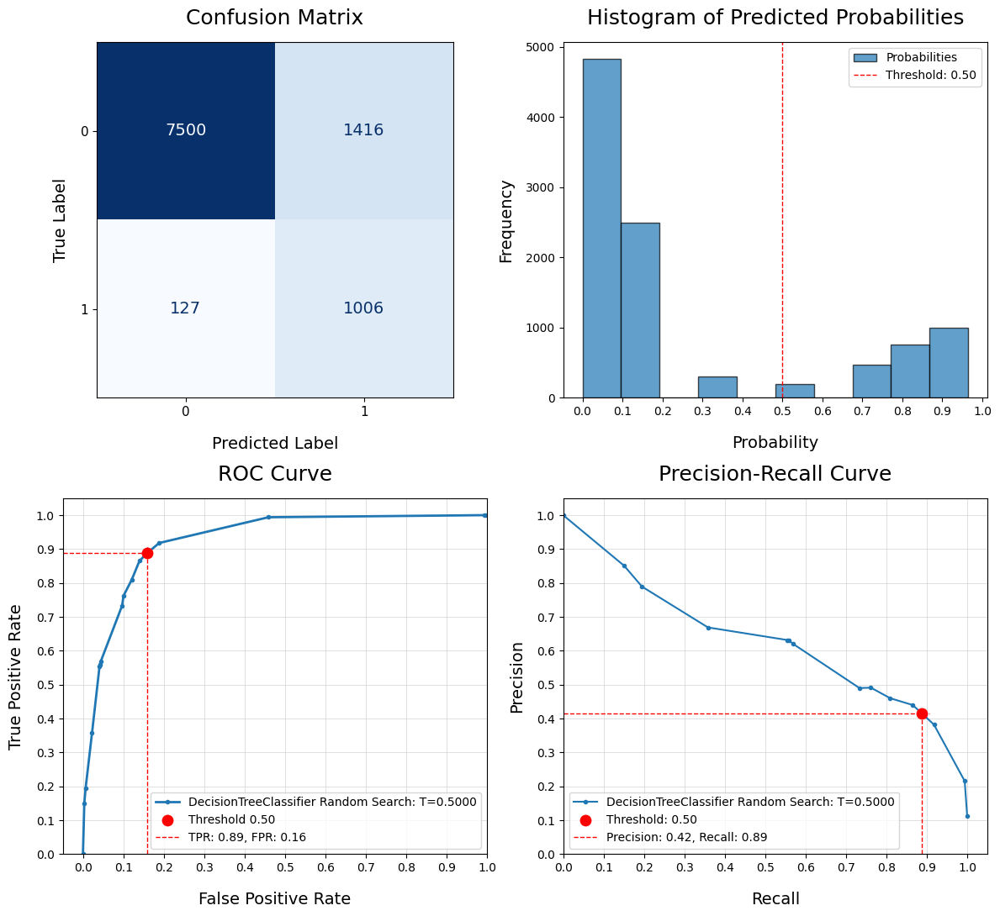


-----------------------------------------------------------------------------------------
3/4: Starting KNeighborsClassifier Random Search - Oct 15, 2023 11:51 AM PST
-----------------------------------------------------------------------------------------

Training data resampled to 5.0% of original for KNN and SVM speed improvement
X_train, y_train shapes after:  (1604, 57) (1604,)
y_train value counts after:  subscribed_enc
0    1337
1     267
Name: count, dtype: int64 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.574 total time=   0.0s
[CV 2/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.444 total time=   0.0s
[CV 3/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.415 total time=   0.0s
[CV 4/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.566 total time=   0.0s
[CV 5/5] END knn__m

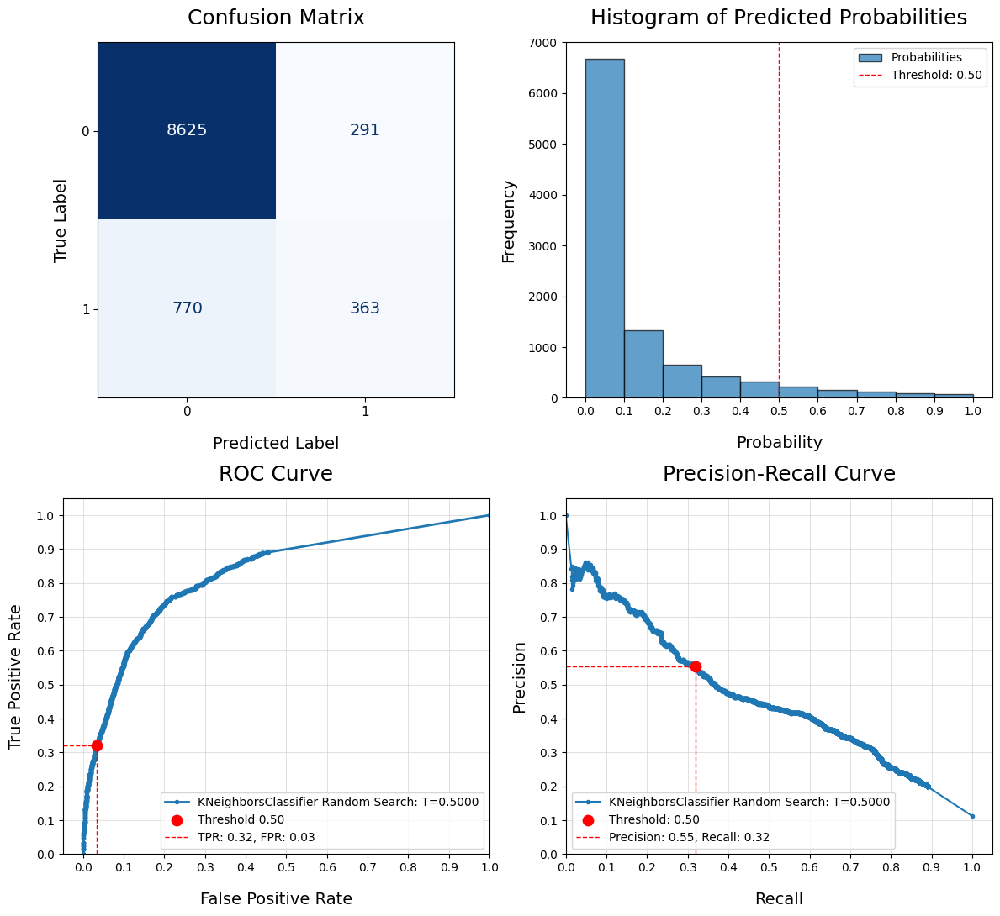


-----------------------------------------------------------------------------------------
4/4: Starting SVC Random Search - Oct 15, 2023 11:51 AM PST
-----------------------------------------------------------------------------------------

Training data already resampled to 5.0% of original for KNN and SVM speed improvement
X_train, y_train shapes:  (1604, 57) (1604,)
y_train value counts:  subscribed_enc
0    1337
1     267
Name: count, dtype: int64 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END ......svm__C=100, svm__kernel=poly;, score=0.722 total time=   0.3s
[CV 2/5] END ......svm__C=100, svm__kernel=poly;, score=0.556 total time=   0.3s
[CV 3/5] END ......svm__C=100, svm__kernel=poly;, score=0.566 total time=   0.3s
[CV 4/5] END ......svm__C=100, svm__kernel=poly;, score=0.604 total time=   0.3s
[CV 5/5] END ......svm__C=100, svm__kernel=poly;, score=0.717 total time=   0.3s
[CV 1/5] END ....svm__C=100, svm__kernel=linear;, score=0.870 total time=  

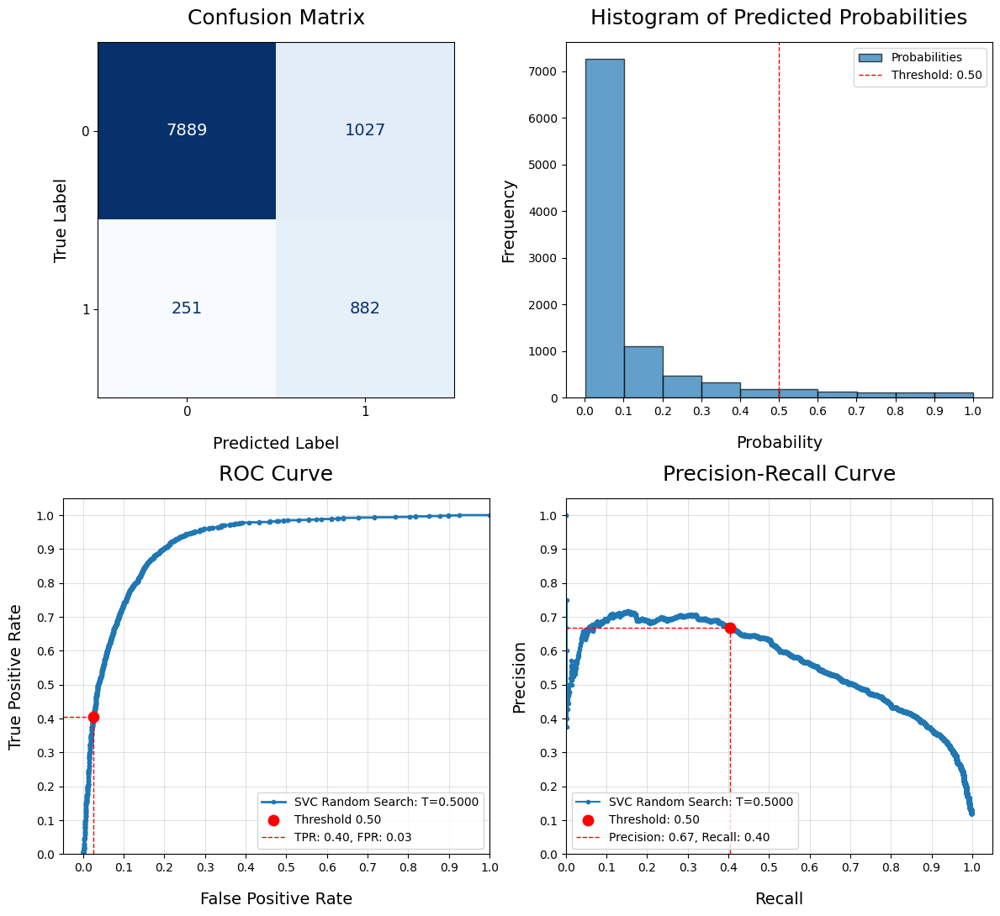

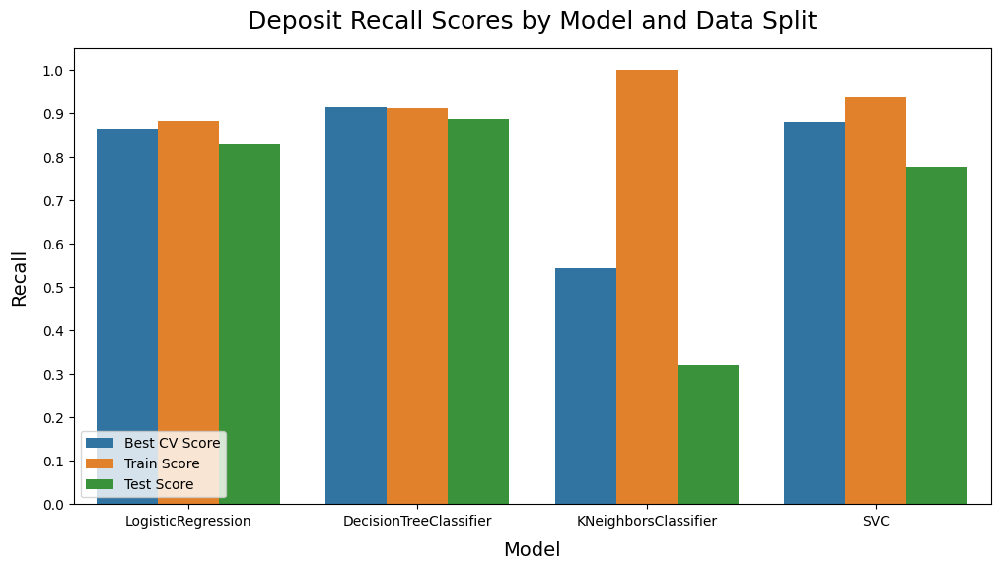

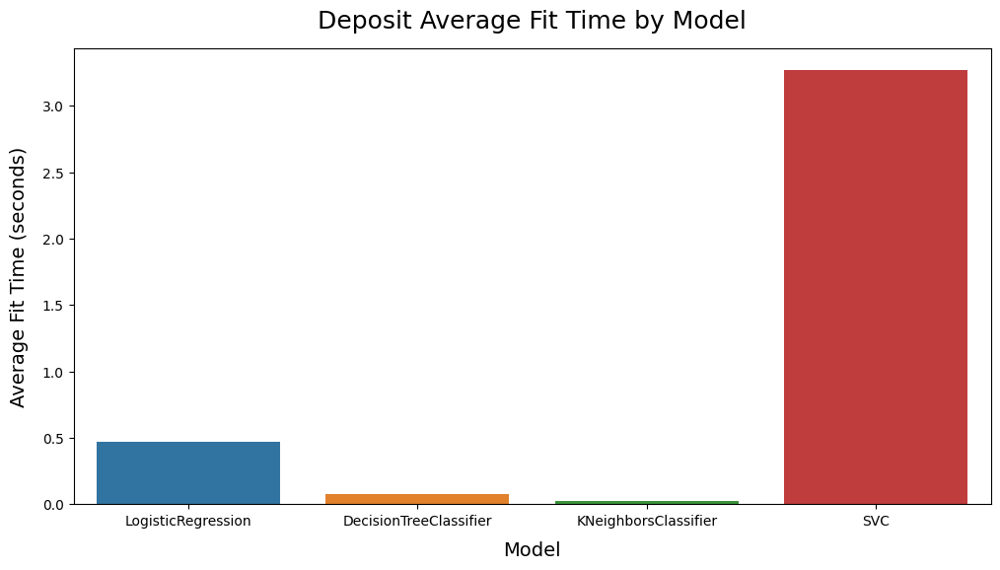

In [117]:
# Run custom function to build pipelines and gridsearch the specified model types and parameters
my_results_df = my.compare_models(X, y, test_size=0.25, model_list=models, grid_params=params, search_type='random',
             plot_perf=True, scorer='recall', neg_label=0, pos_label=1, random_state=42, decimel=4, verbose=4,
             title='Deposit', fig_size=(12,6), legend_loc='lower left', model_eval=True, svm_proba=True, threshold=0.5,
             stratify=df_enc['subscribed_enc'], class_weight='balanced', under_sample=None, over_sample=0.2,
             svm_knn_resample=0.05, notes='Random search (Recall), test_size=0.25, SMOTE=0.2, T=0.50', n_jobs=None)

In [118]:
my_results_df

,Model,Test Size,Over Sample,Under Sample,Resample,Total Fit Time,Fit Count,Average Fit Time,Inference Time,Grid Scorer,Best Params,Best CV Score,Train Score,Test Score,Overfit,Overfit Difference,Train Accuracy Score,Test Accuracy Score,Train Precision Score,Test Precision Score,Train Recall Score,Test Recall Score,Train F1 Score,Test F1 Score,Train ROC AUC Score,Test ROC AUC Score,Threshold:,True Positives,False Positives,True Negatives,False Negatives,TPR,FPR,TNR,FNR,False Rate,Notes,Timestamp
0,LogisticRegression,0.25,0.20,None,None,23.54,50,0.47,0.00,Recall,"{'logreg__solver': 'lbfgs', 'logreg__C': 1}",0.86,0.88,0.83,Yes,0.05,0.89,0.88,0.62,0.49,0.88,0.83,0.73,0.62,0.96,0.94,0.50,942,985,7931,191,0.83,0.11,0.89,0.17,0.28,"Random search (Recall), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 11:50 AM PST"
1,DecisionTreeClassifier,0.25,0.20,None,None,3.96,50,0.08,0.00,Recall,"{'tree__min_samples_split': 20, 'tree__min_samples_leaf': 2, 'tree__max_depth': 4, 'tree__criterion': 'entropy'}",0.92,0.91,0.89,Yes,0.02,0.85,0.85,0.54,0.42,0.91,0.89,0.67,0.57,0.93,0.93,0.50,1006,1416,7500,127,0.89,0.16,0.84,0.11,0.27,"Random search (Recall), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 11:51 AM PST"
2,KNeighborsClassifier,0.25,0.20,None,0.05,1.35,50,0.03,0.74,Recall,"{'knn__weights': 'distance', 'knn__n_neighbors': 10, 'knn__metric': 'manhattan'}",0.54,1.00,0.32,Yes,0.68,1.00,0.89,1.00,0.56,1.00,0.32,1.00,0.41,1.00,0.83,0.50,363,291,8625,770,0.32,0.03,0.97,0.68,0.71,"Random search (Recall), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 11:51 AM PST"
3,SVC,0.25,0.20,None,0.05,163.30,50,3.27,0.15,Recall,"{'svm__kernel': 'linear', 'svm__C': 0.1}",0.88,0.94,0.78,Yes,0.16,0.89,0.87,0.61,0.46,0.94,0.78,0.74,0.58,0.96,0.92,0.50,882,1027,7889,251,0.78,0.12,0.88,0.22,0.34,"Random search (Recall), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 11:51 AM PST"


<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> From this randomized grid search, we've been able to identify the best parameters using Recall as the scorer for the 4 model types. For this search, test size was 0.25, we oversampled the minority class using SMOTE at 0.2, and we used the default threshold of 0.5. We can now compare their performance:
    <ul>
        <li><b>Decision Trees</b> had the best Recall score at 0.89, and had the best False Negative Rate at 0.11. 1006 True Positives were captured, and only 127 successful depositors were missed. The difference between its train and test scores were minimal (Train Recall: 0.91, Test Recall: 0.89). The best parameters were: 'tree__min_samples_split': 20, 'tree__min_samples_leaf': 2, 'tree__max_depth': 4, 'tree__criterion': 'entropy'.
        <li><b>Logistic Regression</b> was second best, with a Recall score of 0.83, and a False Negative Rate of 0.17. 942 True Positives were captured, and 191 successful depositors were missed. The best parameters were: 'logreg__solver': 'lbfgs', 'logreg__C': 1.
        <li><b>Support Vector Machine</b> performed okay, with a Recall score of 0.78, and a False Negative Rate of 0.22. 882 True Positives were captured, and 251 successful depositors were missed. The best parameters were: 'svm__kernel': 'linear', 'svm__C': 0.1
        <li><b>K-Nearest Neighbors Classifier</b> was the worse with a Recall score of 0.32, and a False Negative Rate of 0.71, most likely because it could not handle the imbalanced data. Also, in the interests of time, I only analyzed a sample of the dataset for KNN Classifier and SVM, so it could be struggling with this as well. The best parameters were: 'knn__weights': 'distance', 'knn__n_neighbors': 10, 'knn__metric': 'manhattan'.
        <li>In general, all the models were overfit. It may be an issue with the train/test split ratio, we can investigate different test sizes next to see if that will improve things. 
    </ul>
</div>

### Search and Evaluate Best Models (F1)

Let's see if we get better results running the same randomized grid search, but this time using F1 as the scorer instead of Recall.


-----------------------------------------------------------------------------------------
Starting Data Processing - Oct 15, 2023 10:39 PM PST
-----------------------------------------------------------------------------------------

Train/Test split, test_size:  0.25
X_train, X_test, y_train, y_test shapes:  (30146, 57) (10049, 57) (30146,) (10049,)

Oversampling via SMOTE strategy:  0.2
X_train, y_train shapes before:  (30146, 57) (30146,)
y_train value counts before:  subscribed_enc
0    26746
1     3400
Name: count, dtype: int64
Running SMOTE on X_train, y_train...
X_train, y_train shapes after:  (32095, 57) (32095,)
y_train value counts after:  subscribed_enc
0    26746
1     5349
Name: count, dtype: int64

-----------------------------------------------------------------------------------------
1/4: Starting LogisticRegression Random Search - Oct 15, 2023 10:39 PM PST
-----------------------------------------------------------------------------------------

Fitting 5 folds for e

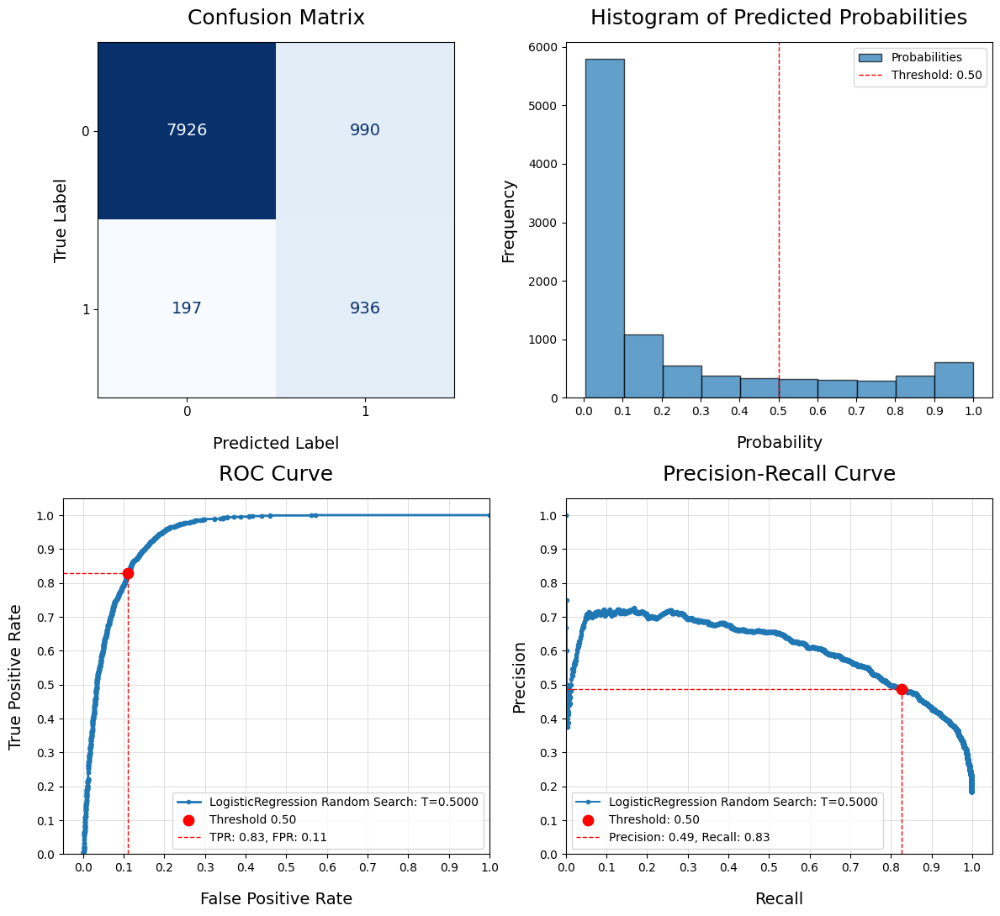


-----------------------------------------------------------------------------------------
2/4: Starting DecisionTreeClassifier Random Search - Oct 15, 2023 10:39 PM PST
-----------------------------------------------------------------------------------------

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.686 total time=   0.1s
[CV 2/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.710 total time=   0.1s
[CV 3/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.694 total time=   0.1s
[CV 4/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.682 total time=   0.1s
[CV 5/5] END tree__criterion=gini, tree__max_depth=7, tree__min_samples_leaf=4, tree__min_samples_split=20;, score=0.7

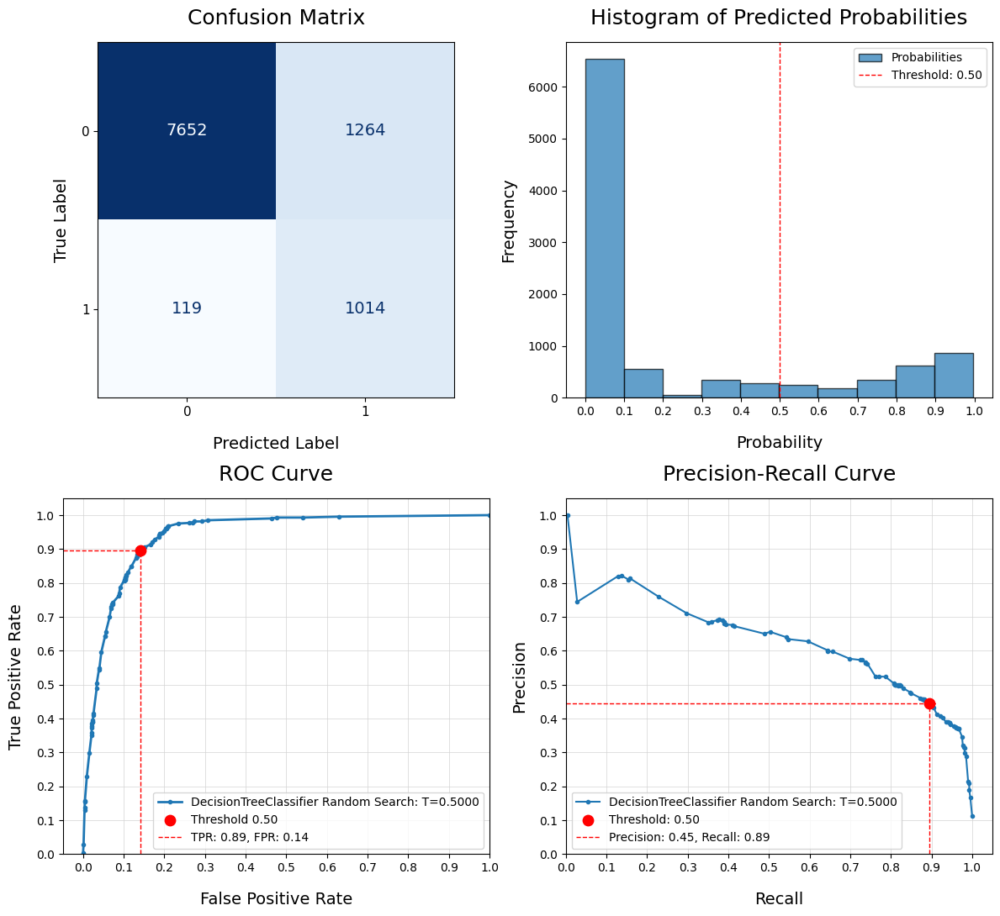


-----------------------------------------------------------------------------------------
3/4: Starting KNeighborsClassifier Random Search - Oct 15, 2023 10:39 PM PST
-----------------------------------------------------------------------------------------

Training data resampled to 5.0% of original for KNN and SVM speed improvement
X_train, y_train shapes after:  (1604, 57) (1604,)
y_train value counts after:  subscribed_enc
0    1337
1     267
Name: count, dtype: int64 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.626 total time=   0.0s
[CV 2/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.552 total time=   0.0s
[CV 3/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.506 total time=   0.0s
[CV 4/5] END knn__metric=euclidean, knn__n_neighbors=3, knn__weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END knn__m

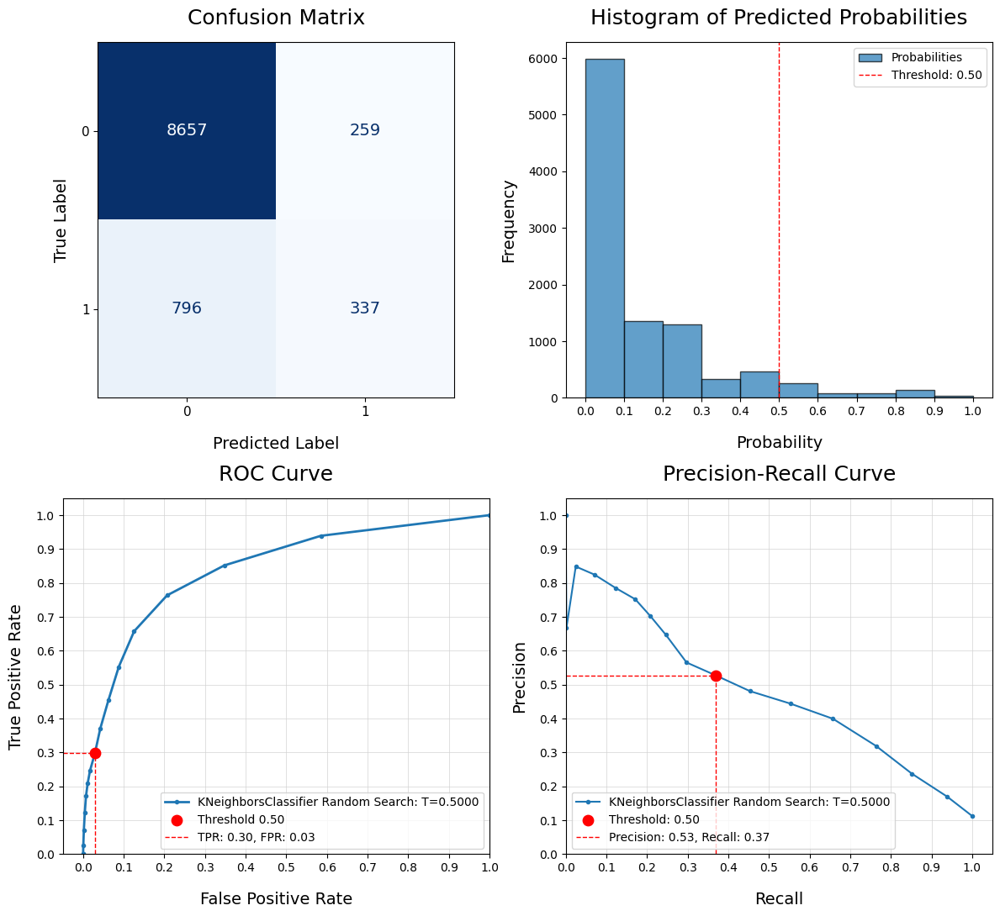


-----------------------------------------------------------------------------------------
4/4: Starting SVC Random Search - Oct 15, 2023 10:40 PM PST
-----------------------------------------------------------------------------------------

Training data already resampled to 5.0% of original for KNN and SVM speed improvement
X_train, y_train shapes:  (1604, 57) (1604,)
y_train value counts:  subscribed_enc
0    1337
1     267
Name: count, dtype: int64 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END ......svm__C=100, svm__kernel=poly;, score=0.690 total time=   0.4s
[CV 2/5] END ......svm__C=100, svm__kernel=poly;, score=0.612 total time=   0.4s
[CV 3/5] END ......svm__C=100, svm__kernel=poly;, score=0.606 total time=   0.4s
[CV 4/5] END ......svm__C=100, svm__kernel=poly;, score=0.610 total time=   0.3s
[CV 5/5] END ......svm__C=100, svm__kernel=poly;, score=0.724 total time=   0.4s
[CV 1/5] END ....svm__C=100, svm__kernel=linear;, score=0.712 total time=  

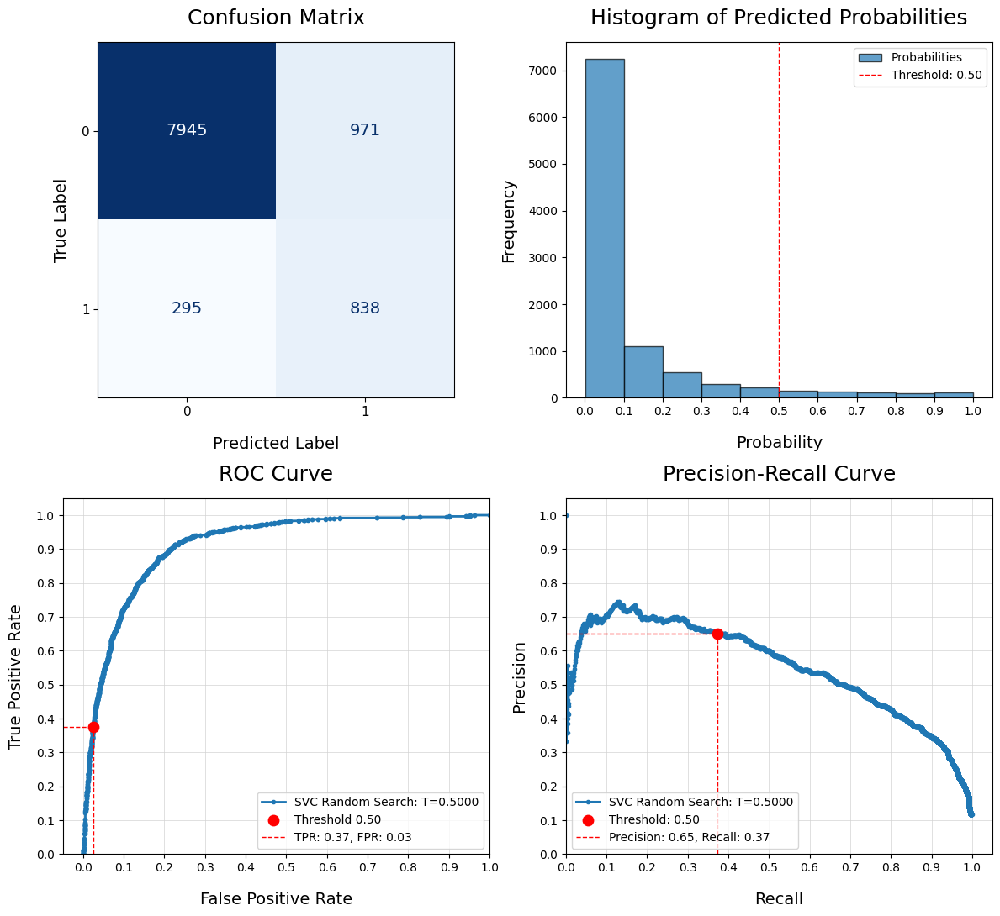

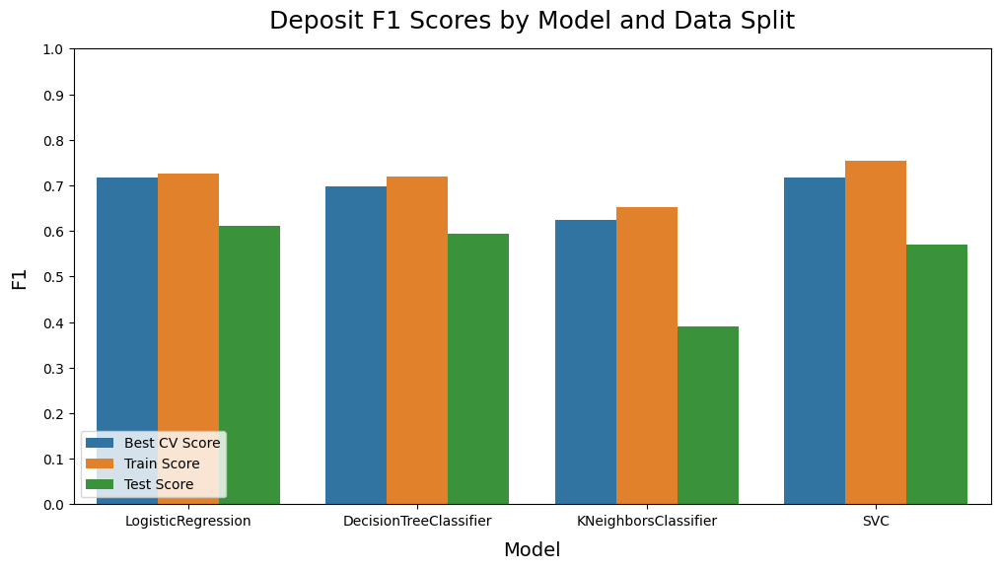

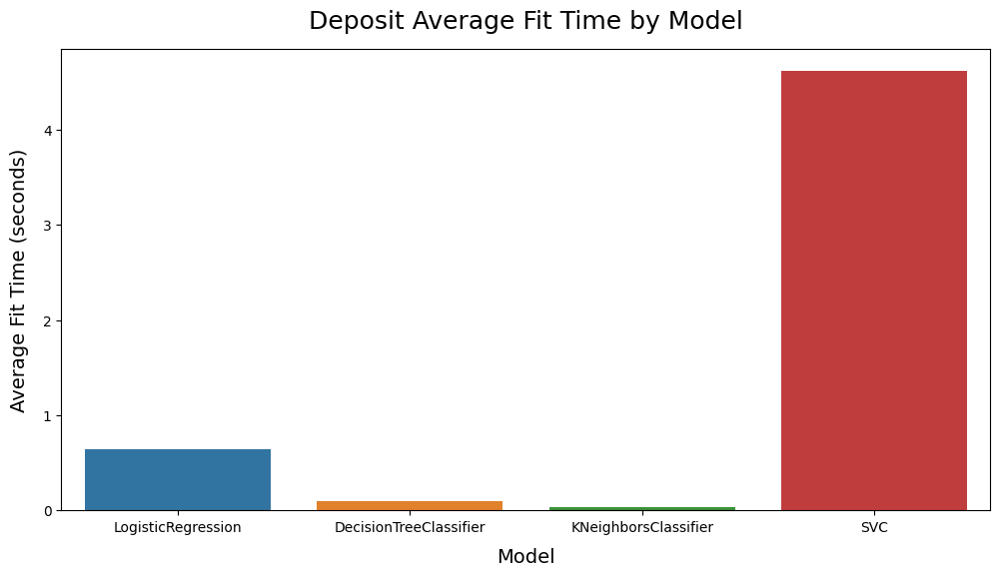

In [246]:
# Run custom function to build pipelines and gridsearch the specified model types and parameters
my_results2_df = my.compare_models(X, y, test_size=0.25, model_list=models, grid_params=params, search_type='random',
             plot_perf=True, scorer='f1', neg_label=0, pos_label=1, random_state=42, decimel=4, verbose=4,
             title='Deposit', fig_size=(12,6), legend_loc='lower left', model_eval=True, svm_proba=True, threshold=0.5,
             stratify=df_enc['subscribed_enc'], class_weight='balanced', under_sample=None, over_sample=0.2,
             svm_knn_resample=0.05, notes='Random search (F1), test_size=0.25, SMOTE=0.2, T=0.50', n_jobs=None)

In [247]:
my_results2_df

,Model,Test Size,Over Sample,Under Sample,Resample,Total Fit Time,Fit Count,Average Fit Time,Inference Time,Grid Scorer,Best Params,Best CV Score,Train Score,Test Score,Overfit,Overfit Difference,Train Accuracy Score,Test Accuracy Score,Train Precision Score,Test Precision Score,Train Recall Score,Test Recall Score,Train F1 Score,Test F1 Score,Train ROC AUC Score,Test ROC AUC Score,Threshold,True Positives,False Positives,True Negatives,False Negatives,TPR,FPR,TNR,FNR,False Rate,Notes,Timestamp
0,LogisticRegression,0.25,0.20,None,None,32.27,50,0.65,0.01,F1,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.1}",0.72,0.73,0.61,Yes,0.11,0.89,0.88,0.62,0.49,0.88,0.83,0.73,0.61,0.96,0.94,0.50,936,990,7926,197,0.83,0.11,0.89,0.17,0.28,"Random search (F1), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 10:39 PM PST"
1,DecisionTreeClassifier,0.25,0.20,None,None,4.66,50,0.09,0.00,F1,"{'tree__min_samples_split': 40, 'tree__min_samples_leaf': 6, 'tree__max_depth': 7, 'tree__criterion': 'gini'}",0.70,0.72,0.59,Yes,0.12,0.88,0.86,0.58,0.45,0.94,0.89,0.72,0.59,0.96,0.94,0.50,1014,1264,7652,119,0.89,0.14,0.86,0.11,0.25,"Random search (F1), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 10:39 PM PST"
2,KNeighborsClassifier,0.25,0.20,None,0.05,1.57,50,0.03,1.11,F1,"{'knn__weights': 'uniform', 'knn__n_neighbors': 15, 'knn__metric': 'manhattan'}",0.62,0.65,0.39,Yes,0.26,0.90,0.90,0.80,0.57,0.55,0.30,0.65,0.39,0.93,0.84,0.50,337,259,8657,796,0.30,0.03,0.97,0.70,0.73,"Random search (F1), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 10:39 PM PST"
3,SVC,0.25,0.20,None,0.05,230.64,50,4.61,0.14,F1,"{'svm__kernel': 'linear', 'svm__C': 100}",0.72,0.75,0.57,Yes,0.19,0.90,0.87,0.63,0.46,0.94,0.74,0.75,0.57,0.96,0.91,0.50,838,971,7945,295,0.74,0.11,0.89,0.26,0.37,"Random search (F1), test_size=0.25, SMOTE=0.2, T=0.50","Oct 15, 2023 10:40 PM PST"


<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> From this 2nd randomized grid search, we've been able to identify the best parameters using F1 as the scorer for the 4 model types. For this search, test size was 0.25, we oversampled the minority class using SMOTE at 0.2, and we used the default threshold of 0.5. We can now compare their performance:
    <ul>
        <li><b>Logistic Regression</b> had the best F1 score at 0.61. It had a Recall score of 0.83, and a False Negative Rate of 0.17. 936 True Positives were captured, and 197 successful depositors were missed (slightly less than before). The best parameters were: 'logreg__solver': 'newton-cg', 'logreg__C': 0.1. 
        <li><b>Decision Trees</b> had an F1 score of 0.59, and again had the best Recall score at 0.89, and the best False Negative Rate at 0.11. 1014 True Positives were captured, and only 119 successful depositors were missed (both slightly better than before). The best parameters were: 'tree__min_samples_split': 40, 'tree__min_samples_leaf': 6, 'tree__max_depth': 7, 'tree__criterion': 'gini'.
        <li><b>Support Vector Machine</b> had an F1 score of 0.57, a Recall score of 0.74, and a False Negative Rate of 0.26. 838 True Positives were captured, and 295 successful depositors were missed (worse than before). The best parameters were: 'svm__kernel': 'linear', 'svm__C': 100.
        <li><b>K-Nearest Neighbors Classifier</b> was the worst with an F1 0.39, a Recall score of 0.30, and a False Negative Rate of 0.70, again most likely due to the imbalanced data. The best parameters were: 'knn__weights': 'uniform', 'knn__n_neighbors': 15, 'knn__metric': 'manhattan'.
        <li>Again, all the models were overfit. It may be an issue with the train/test split ratio, we can investigate different test sizes next to see if that will improve things. 
    </ul>
</div>

### Best Decision Tree Model

Let's build the best decision tree, and evaluate it's logic, to see if we can learn something about the factors driving clients to successfully deposit.

In [298]:
my.build_tree(X, y, title='Deposit', test_size=0.25, stratify=df_enc['subscribed_enc'],
              max_depth=7, min_samples_split=40, min_samples_leaf=6, criterion='gini',
              class_weight='balanced', classifier='dt', iterate=False, list_tree=False, draw_tree=True,
              over_sample=0.2, under_sample=None, fig_size=(240,35), fontsize=10, rounded=True,
              class_names=True)

Train/Test split, test_size:  0.25
X_train, X_test, y_train, y_test shapes:  (30146, 57) (10049, 57) (30146,) (10049,)

Oversampling via SMOTE strategy:  0.2
X_train, y_train shapes before:  (30146, 57) (30146,)
y_train value counts before:  subscribed_enc
0    26746
1     3400
Name: count, dtype: int64
Running SMOTE on X_train, y_train...
X_train, y_train shapes after:  (32095, 57) (32095,)
y_train value counts after:  subscribed_enc
0    26746
1     5349
Name: count, dtype: int64


<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> The Decision Tree is extremely complex, and is probably overfitted to the data. However, it does confirm some of the earlier correlations we identified as the major drivers of successful campaigns: Duration, Number Employed, Euribor, Employment Variation Rate, etc. are the major drivers. Unfortunately this tree uses almost every variable in its attempt to perfectly classify everything. We can prune this back by changing the parameters.
</div>

### Meta Search on Test Size and Threshold

I'll now run a meta search that will loop through a variety of Train/Test split test_size values, and Threshold values, and run `my.compare_models` for each combination. We'll suppress the output here and store all the results in a dataframe that we can evaluate afterward.

In [120]:
# Create a dataframe to store results of this meta gridsearch
all_results_df = pd.DataFrame()

In [121]:
# Set a range of train/test split test_sizes and probability thresholds for class assignment
test_sizes = np.around(np.arange(0.2, 0.4, 0.05), 2)
thresholds = np.around(np.arange(0.3, 0.7, 0.05), 2)

In [123]:
# Loop through the test_sizes and thresholds, running a custom function to gridsearch the 4 models
counter = 1
total_iterations = len(test_sizes) * len(thresholds)

for test_size in test_sizes:
    for threshold in thresholds:
        timestamp = datetime.now().strftime("%b %d, %Y %I:%M %p %Z")
        print(f"{counter}/{total_iterations}: test_size: {test_size}, threshold: {threshold} - {timestamp}")
        
        results_df = my.compare_models(X, y, test_size=test_size, model_list=models, grid_params=params, search_type='random',
                 plot_perf=False, scorer='recall', neg_label=0, pos_label=1, random_state=42, decimel=4, verbose=0,
                 title='Deposit', fig_size=(12,6), legend_loc='lower left', model_eval=True, svm_proba=True, threshold=threshold,
                 stratify=df_enc['subscribed_enc'], class_weight='balanced', under_sample=None, over_sample=0.2,
                 svm_knn_resample=0.05, notes=f"{counter}/{total_iterations}: Random Search: Recall, test_size: {test_size}, SMOTE: 0.2, threshold: {threshold}", n_jobs=None, output=False)
        
        # Concatenate the current results DataFrame to the overall results DataFrame
        all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
        counter += 1

1/32: test_size: 0.2, threshold: 0.3 - Oct 15, 2023 12:23 PM 
2/32: test_size: 0.2, threshold: 0.35 - Oct 15, 2023 12:27 PM 
3/32: test_size: 0.2, threshold: 0.4 - Oct 15, 2023 12:31 PM 
4/32: test_size: 0.2, threshold: 0.45 - Oct 15, 2023 12:35 PM 
5/32: test_size: 0.2, threshold: 0.5 - Oct 15, 2023 12:39 PM 
6/32: test_size: 0.2, threshold: 0.55 - Oct 15, 2023 12:44 PM 
7/32: test_size: 0.2, threshold: 0.6 - Oct 15, 2023 12:48 PM 
8/32: test_size: 0.2, threshold: 0.65 - Oct 15, 2023 12:52 PM 
9/32: test_size: 0.25, threshold: 0.3 - Oct 15, 2023 12:56 PM 
10/32: test_size: 0.25, threshold: 0.35 - Oct 15, 2023 12:59 PM 
11/32: test_size: 0.25, threshold: 0.4 - Oct 15, 2023 01:02 PM 
12/32: test_size: 0.25, threshold: 0.45 - Oct 15, 2023 01:06 PM 
13/32: test_size: 0.25, threshold: 0.5 - Oct 15, 2023 01:09 PM 
14/32: test_size: 0.25, threshold: 0.55 - Oct 15, 2023 01:13 PM 
15/32: test_size: 0.25, threshold: 0.6 - Oct 15, 2023 01:16 PM 
16/32: test_size: 0.25, threshold: 0.65 - Oct 15, 

## Review Model Performance

Here's the dataframe that tracked the results of each iteration, including a definition of the pipeline, and a note that was manually entered. It has all the major error and performance scores, plus a timestamp.

In [96]:
# Set dataframe output to not show scientific notation
#pd.reset_option('display.float_format')
#pd.set_option('display.float_format', '{:.2f}'.format)

In [232]:
# Review results of grid search and meta search
all_results_df.sort_values(by='False Rate', ascending=True)[:10]

,Model,Test Size,Over Sample,Under Sample,Resample,Total Fit Time,Fit Count,Average Fit Time,Inference Time,Grid Scorer,Best Params,Best CV Score,Train Score,Test Score,Overfit,Overfit Difference,Train Accuracy Score,Test Accuracy Score,Train Precision Score,Test Precision Score,Train Recall Score,Test Recall Score,Train F1 Score,Test F1 Score,Train ROC AUC Score,Test ROC AUC Score,Threshold,True Positives,False Positives,True Negatives,False Negatives,TPR,FPR,TNR,FNR,False Rate,Notes,Timestamp
0,LogisticRegression,0.20,0.20,None,None,25.87,50,0.52,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.49,0.89,0.82,0.73,0.61,0.96,0.94,0.30,851,1305,5827,56,0.94,0.18,0.82,0.06,0.24,"1/32: Random Search: Recall, test_size: 0.2, SMOTE: 0.2, threshold: 0.3","Oct 15, 2023 12:23 PM PST"
64,LogisticRegression,0.30,0.20,None,None,23.04,50,0.46,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.48,0.89,0.82,0.73,0.61,0.96,0.94,0.30,1272,1972,8727,88,0.94,0.18,0.82,0.06,0.24,"17/32: Random Search: Recall, test_size: 0.3, SMOTE: 0.2, threshold: 0.3","Oct 15, 2023 01:23 PM PST"
36,LogisticRegression,0.25,0.20,None,None,23.75,50,0.48,0.01,Recall,"{'logreg__solver': 'lbfgs', 'logreg__C': 1}",0.86,0.88,0.83,Yes,0.05,0.89,0.88,0.62,0.49,0.88,0.83,0.73,0.62,0.96,0.94,0.35,1032,1381,7535,101,0.91,0.15,0.85,0.09,0.24,"10/32: Random Search: Recall, test_size: 0.25, SMOTE: 0.2, threshold: 0.35","Oct 15, 2023 12:59 PM PST"
32,LogisticRegression,0.25,0.20,None,None,23.74,50,0.47,0.01,Recall,"{'logreg__solver': 'lbfgs', 'logreg__C': 1}",0.86,0.88,0.83,Yes,0.05,0.89,0.88,0.62,0.49,0.88,0.83,0.73,0.62,0.96,0.94,0.30,1057,1560,7356,76,0.93,0.17,0.83,0.07,0.24,"9/32: Random Search: Recall, test_size: 0.25, SMOTE: 0.2, threshold: 0.3","Oct 15, 2023 12:56 PM PST"
100,LogisticRegression,0.35,0.20,None,None,18.72,50,0.37,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.07,0.89,0.88,0.62,0.48,0.89,0.82,0.73,0.61,0.96,0.94,0.35,1440,2035,10447,147,0.91,0.16,0.84,0.09,0.25,"26/32: Random Search: Recall, test_size: 0.35, SMOTE: 0.2, threshold: 0.35","Oct 15, 2023 01:50 PM PST"
8,LogisticRegression,0.20,0.20,None,None,26.33,50,0.53,0.00,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.49,0.89,0.82,0.73,0.61,0.96,0.94,0.40,804,1014,6118,103,0.89,0.14,0.86,0.11,0.25,"3/32: Random Search: Recall, test_size: 0.2, SMOTE: 0.2, threshold: 0.4","Oct 15, 2023 12:31 PM PST"
96,LogisticRegression,0.35,0.20,None,None,18.28,50,0.37,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.07,0.89,0.88,0.62,0.48,0.89,0.82,0.73,0.61,0.96,0.94,0.30,1483,2305,10177,104,0.93,0.18,0.82,0.07,0.25,"25/32: Random Search: Recall, test_size: 0.35, SMOTE: 0.2, threshold: 0.3","Oct 15, 2023 01:47 PM PST"
72,LogisticRegression,0.30,0.20,None,None,23.02,50,0.46,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.48,0.89,0.82,0.73,0.61,0.96,0.94,0.40,1204,1548,9151,156,0.89,0.14,0.86,0.11,0.25,"19/32: Random Search: Recall, test_size: 0.3, SMOTE: 0.2, threshold: 0.4","Oct 15, 2023 01:29 PM PST"
68,LogisticRegression,0.30,0.20,None,None,23.25,50,0.46,0.01,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.48,0.89,0.82,0.73,0.61,0.96,0.94,0.35,1235,1744,8955,125,0.91,0.16,0.84,0.09,0.25,"18/32: Random Search: Recall, test_size: 0.3, SMOTE: 0.2, threshold: 0.35","Oct 15, 2023 01:26 PM PST"
4,LogisticRegression,0.20,0.20,None,None,25.85,50,0.52,0.00,Recall,"{'logreg__solver': 'newton-cg', 'logreg__C': 0.01}",0.87,0.89,0.82,Yes,0.06,0.89,0.88,0.62,0.49,0.89,0.82,0.73,0.61,0.96,0.94,0.35,828,1149,5983,79,0.91,0.16,0.84,0.09,0.25,"2/32: Random Search: Recall, test_size: 0.2, SMOTE: 0.2, threshold: 0.35","Oct 15, 2023 12:27 PM PST"


In [252]:
# Show details of the best selected model, based on a judgement call
all_results_df.query('index == 32')

,Model,Test Size,Over Sample,Under Sample,Resample,Total Fit Time,Fit Count,Average Fit Time,Inference Time,Grid Scorer,Best Params,Best CV Score,Train Score,Test Score,Overfit,Overfit Difference,Train Accuracy Score,Test Accuracy Score,Train Precision Score,Test Precision Score,Train Recall Score,Test Recall Score,Train F1 Score,Test F1 Score,Train ROC AUC Score,Test ROC AUC Score,Threshold,True Positives,False Positives,True Negatives,False Negatives,TPR,FPR,TNR,FNR,False Rate,Notes,Timestamp
32,LogisticRegression,0.25,0.20,None,None,23.74,50,0.47,0.01,Recall,"{'logreg__solver': 'lbfgs', 'logreg__C': 1}",0.86,0.88,0.83,Yes,0.05,0.89,0.88,0.62,0.49,0.88,0.83,0.73,0.62,0.96,0.94,0.30,1057,1560,7356,76,0.93,0.17,0.83,0.07,0.24,"9/32: Random Search: Recall, test_size: 0.25, SMOTE: 0.2, threshold: 0.3","Oct 15, 2023 12:56 PM PST"


<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> After performing the meta search across different test sizes and thresholds, I've sorted the results above based on "False Rate" – this is just the sum of the False Negative Rate and the False Positive Rate, which is another way of looking at the total error. The lowest models have a 0.24 False Rate, and if we take a closer look, it seems the best model for maximum Recall and least False Negatives is:
    <ul>
        <li><b>Model:</b> Logistic Regression (Index 32)
        <li><b>Test Size:</b> 0.25
        <li><b>Minority Oversample:</b> 0.20 
        <li><b>Threshold:</b> 0.30
        <li><b>Recall: 0.83 Test</b>, 0.88 Train (Overfit, 0.05 difference) 
        <li><b>F1:</b> 0.62 Test, 0.73 Train 
        <li><b>Accuracy:</b> 0.88 Test, 0.89 Train
        <li><b>Precision:</b> 0.39 Test, 0.62 Train 
        <li><b>True Positive Rate: 0.93</b> (1,057 True Positives)
        <li><b>True Negative Rate:</b> 0.83 (7,356 True Negatives)
        <li><b>False Negative Rate: 0.07</b> (76 False Negatives)
        <li><b>False Positive Rate:</b> 0.17 (1,560 False Positives)
        <li><b>Best Params:</b> 'logreg__solver': 'lbfgs', 'logreg__C': 1
    </ul>
What's interesting, is there are better Recall scores in this dataset for Decision Trees (0.91 is the best), but when I look at the number of False Negatives and False Positives, it's worse than what we have for this Logistic Regression model (Decision Tree had 139 False Negatives, almost double, and 2,224 False Positives, almost 50% more).
</div>

### Examine Best Model

Let's take a closer look at the best model's performance in a confusion matrix and some charts.

#### Build the Pipeline

In [291]:
# Create a pipeline with Standard Scaler and Logistic Regression with class weightings
best_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(solver='lbfgs', C=1, max_iter=10000, class_weight='balanced', random_state=42))
])

#### Fit the Data

In [292]:
# Fit the pipeline with the resampled training data
best_pipe.fit(X2_train, y2_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=1, class_weight='balanced',
                                    max_iter=10000, random_state=42))])

#### Make Predictions

In [293]:
# Make predictions with the resampled test data
best_preds = best_pipe.predict(X_test)

#### Evaluate Model Performance


Best Model: LogReg, W=balanced, SMOTE=0.2, T=0.3 Binary Classification Report

              precision    recall  f1-score   support

           0       0.99      0.83      0.90      8916
           1       0.40      0.93      0.56      1133

    accuracy                           0.84     10049
   macro avg       0.70      0.88      0.73     10049
weighted avg       0.92      0.84      0.86     10049

ROC AUC:  0.94 

               Predicted:0         1         
Actual: 0                7356      1560      
Actual: 1                76        1057      

True Positive Rate / Sensitivity: 0.93
True Negative Rate / Specificity: 0.83
False Positive Rate / Fall-out: 0.17
False Negative Rate / Miss Rate: 0.07

Positive Label: 1
Class Weight:  balanced


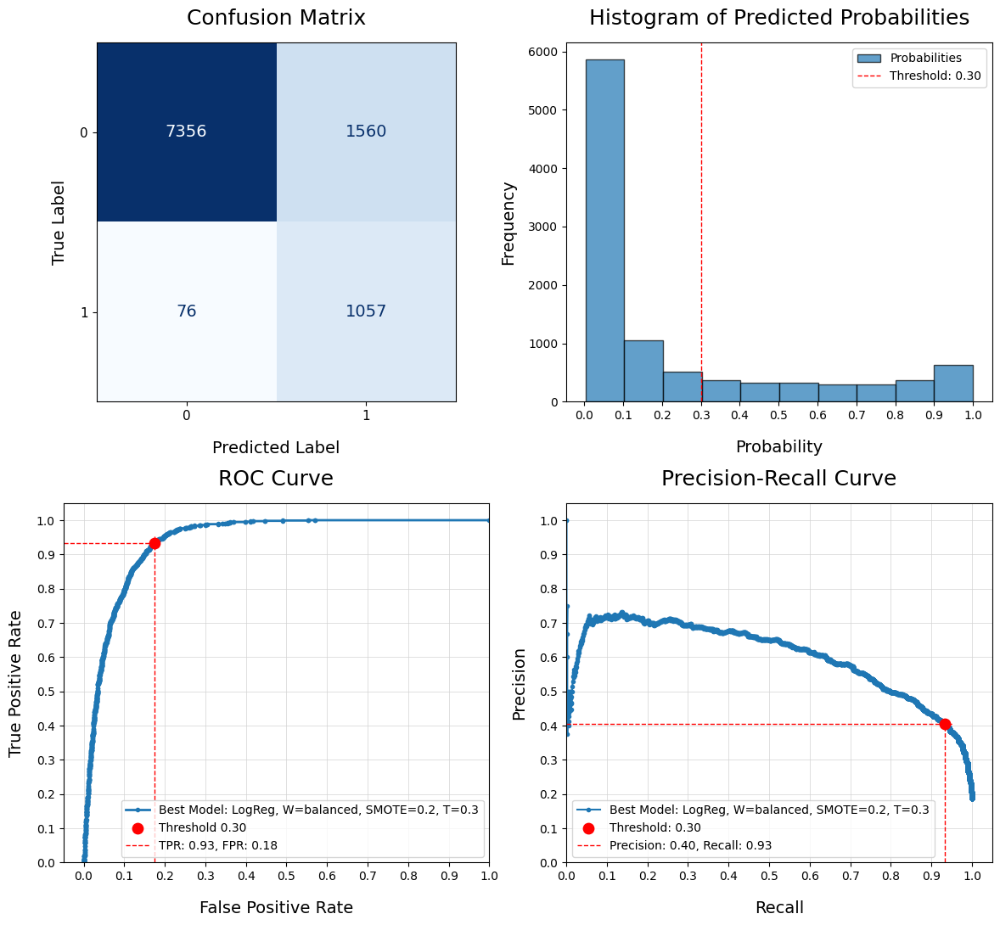

In [297]:
# Evaluate updated pipeline model with custom function
my.eval_model(y_test=y_test, preds=best_preds, X_test=X_test, estimator=best_pipe,
                        neg_label=0, pos_label=1, class_weight='balanced',
                        title="Best Model: LogReg, W=balanced, SMOTE=0.2, T=0.3", threshold=0.3,
                        decimal=2, plot=True, figsize=(12,11))

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> The above plots provide better visuals on the metrics we summarized earlier for this 'best model.' It highlights where it excels, and where it's not so great. The '76' in the confusion matrix stands out, it's a really small number. But the upper right quadrant shows a large number of false positives. And while we say an optimal threshold placement on the ROC Curve, we see that the Precision-Recall Curve scores high on Recall, but very low on Precision. 
</div>

### Save Results to a File

In [141]:
all_results_df = all_results_df.rename(columns={'Threshold:' : 'Threshold'})

In [142]:
# Save a timestamped backup file
now = datetime.now()
timestamp_str = now.strftime('%Y%m%d_%H%M%S')
all_results_df.to_csv(f'data/all_results_df_{timestamp_str}.csv')

### Distributions of Model Performance

In [153]:
results_cont_columns = ['Average Fit Time', 'Inference Time',
       'Best CV Score', 'Train Score',
       'Test Score', 'Overfit Difference', 'Train Accuracy Score',
       'Test Accuracy Score', 'Train Precision Score', 'Test Precision Score',
       'Train Recall Score', 'Test Recall Score', 'Train F1 Score',
       'Test F1 Score', 'Train ROC AUC Score', 'Test ROC AUC Score',
       'True Positives', 'False Positives', 'True Negatives',
       'False Negatives', 'TPR', 'FPR', 'TNR', 'FNR', 'False Rate']

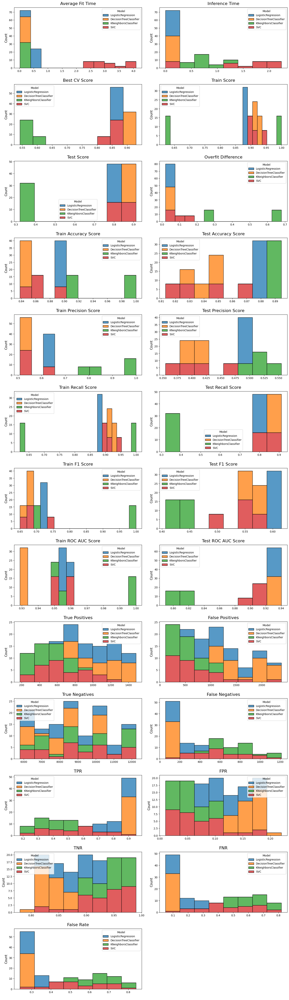

In [155]:
my.plot_charts_with_hue(all_results_df[results_cont_columns + ['Model']], plot_type='cont', multiple='stack', cont_cols=results_cont_columns, hue='Model', ncols=2, fig_width=15, rotation=0)

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> There are a lot of charts above comparing model performance across different metrics, but a few things stand out:
    <ul>
        <li><b>SVC</b> (red bars) has the longest Fit Time by a longshot, and the longest Inference Time
        <li>On the Train data, <b>KNN</b> (green bars) had the highest Accuracy, Precision, and F1 scores, and the worst Recall scores. However, it was the most overfit, as represented by the difference in training and test scores. This is likely because of the imbalanced dataset, and the lack of options (like class weights) to help it pick up on the minority class.
        <li><b>Logistic Regression</b> (blue bars) and <b>Decision Trees</b> (yellow bars) scored the best on True Positives (highest count) and False Negatives (lowest count). Similarly for the True Positive Rate and False Negative Rate.
        <li><b>Logistic Regression</b> (blue bars) and <b>Decision Trees</b> (yellow bars) also scored the lowest on the total error represented by the False Rate (sum of False Positive and False Negative Rates). They were consistently on the low end here, whereas KNN and SVC had a much wider spread and dominated the high end. They were much more prone to error on the test set
    </ul>
</div>

### Multivariate Relationships

In [228]:
# Create a pairplot of all numeric variables to identify interesting relationships to plot
#sns.pairplot(data=all_results_df, hue='Model')
#plt.show()
# Hidden after it's used for notebook performance

### False Positive Rate vs. False Negative Rate

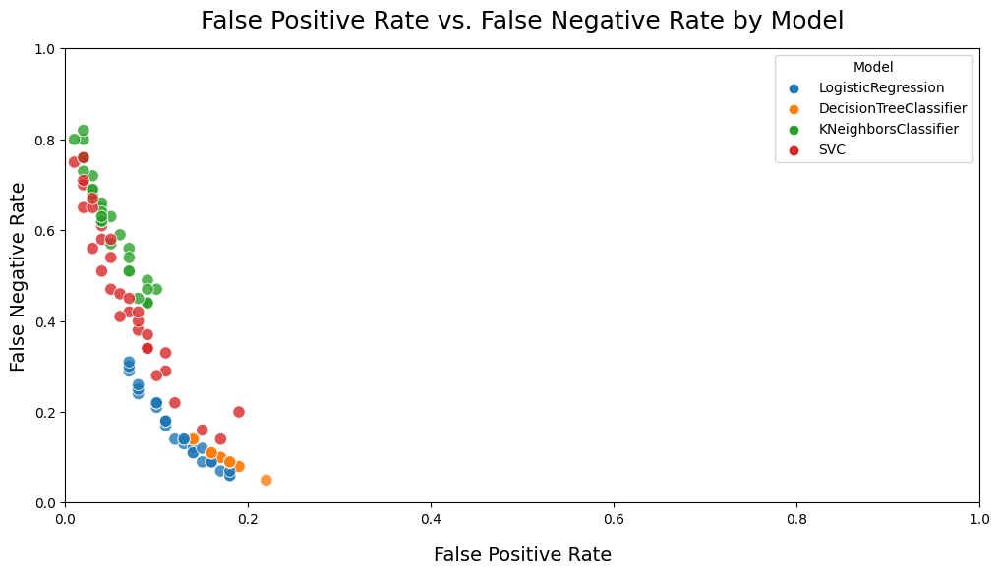

In [172]:
plt.figure(figsize=(12,6))
plt.title('False Positive Rate vs. False Negative Rate by Model', fontsize=18, pad=15)
sns.scatterplot(data=all_results_df, x='FPR', y='FNR', hue='Model', s=80, alpha=0.8)
plt.xlabel('False Positive Rate', fontsize=14, labelpad=15)
plt.ylabel('False Negative Rate', fontsize=14)
plt.xlim(0,1)
plt.ylim(0,1)
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Here we can clearly see that Logistic Regression and Decision Trees perform the best in regard to having the lowest False Negative and False Positive Rates. 
</div>

### False Positives vs. False Negatives

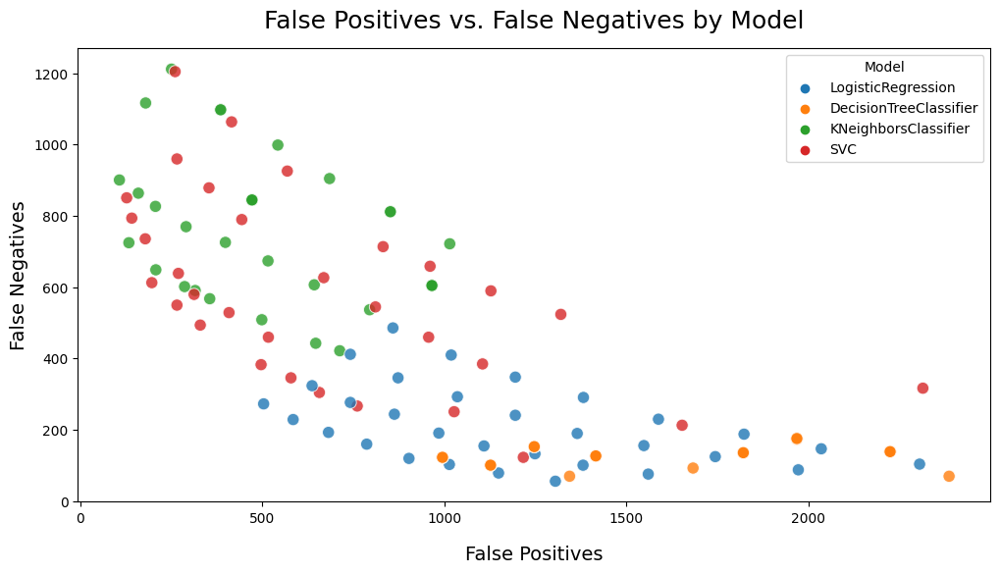

In [174]:
plt.figure(figsize=(12,6))
plt.title('False Positives vs. False Negatives by Model', fontsize=18, pad=15)
sns.scatterplot(data=all_results_df, x='False Positives', y='False Negatives', hue='Model', s=80, alpha=0.8)
plt.xlabel('False Positives', fontsize=14, labelpad=15)
plt.ylabel('False Negatives', fontsize=14)
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Similar chart, just showing the total counts of False Negatives and False Positives. The positive class is the minority class, so seeing more false positives for Logistic Regression and Decision Trees is slightly deceptive. It looks like they are performing worse, but those models are achieving low False Negatives (the minority class) at the expense of False Positives. However, the overall rate of False Positives is still very low since there are so many Negatives in the data set (88% of it). 
</div>

### Precision vs. Recall Scores

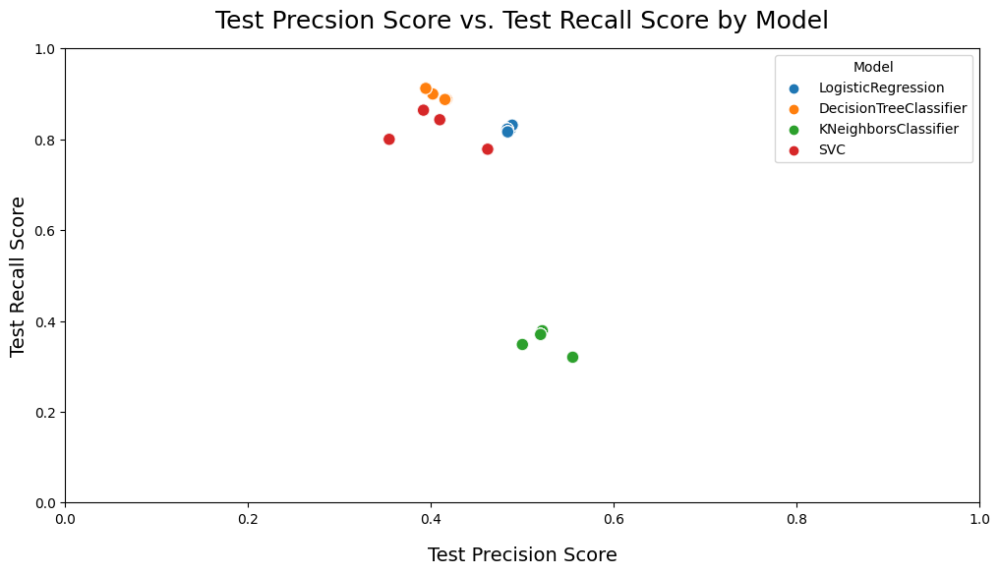

In [177]:
plt.figure(figsize=(12,6))
plt.title('Test Precsion Score vs. Test Recall Score by Model', fontsize=18, pad=15)
sns.scatterplot(data=all_results_df, x='Test Precision Score', y='Test Recall Score', hue='Model', s=80, alpha=0.8)
plt.xlabel('Test Precision Score', fontsize=14, labelpad=15)
plt.ylabel('Test Recall Score', fontsize=14)
plt.xlim(0,1)
plt.ylim(0,1)
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> The x and y axes are on the full scale from 0.0 to 1.0. Precision and recall are in tension. Here we see KNN (green) has the highest Precision, but is much lower on Recall (the imbalanced dataset problem). The rest of the models are relatively similar in their scores, the cluster at the top.
</div>

### ROC AUC vs. F1 Scores

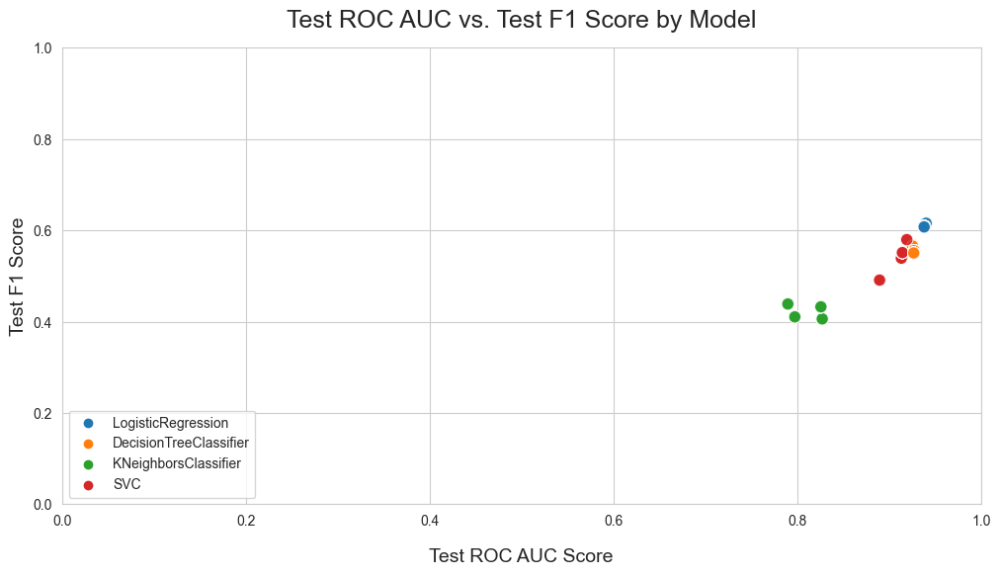

In [234]:
plt.figure(figsize=(12,6))
plt.title('Test ROC AUC vs. Test F1 Score by Model', fontsize=18, pad=15)
sns.scatterplot(data=all_results_df, x='Test ROC AUC Score', y='Test F1 Score', hue='Model', s=80, alpha=0.8)
plt.xlabel('Test ROC AUC Score', fontsize=14, labelpad=15)
plt.ylabel('Test F1 Score', fontsize=14)
plt.xlim(0,1)
plt.ylim(0,1)
plt.legend(loc='lower left')
plt.show()

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> The x and y axes are on the full scale from 0.0 to 1.0. Both F1 and ROC AUC represent a balanced score measure, and here we can see Logistic Regression (blue) is scoring top marks in both measures, with KNN (green) scoring the lowest.
</div>

### Recall Score Comparisons

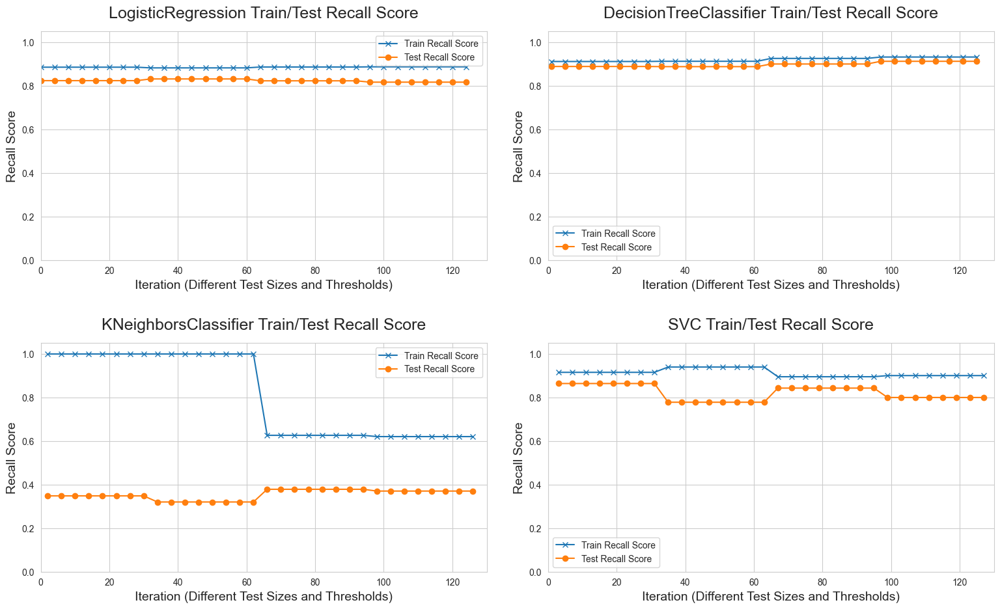

In [222]:
# Use a custom function to compare train/test scores for the 4 models
my.compare_metrics(all_results_df, 'Recall Score')

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Here we can see the Train vs. Test performance on Recall for all 4 models. Decision Trees stand out for their (1) consistency across all the iterations, and (2) the low difference between Train and Test scores. Although every single model was overfit to some degree, Decision Trees were overfit the least. It's a negligable difference. KNN was affected significantly with the changing Test sizes and thresholds. It may be that a certain point, there was not enough training data to do well on the train test. Regarding Test Recall performance, Decision Trees and Logistic Regression perform the best, followed by SVC, and KNN is pretty bad.
</div>

### F1 Score Comparisons

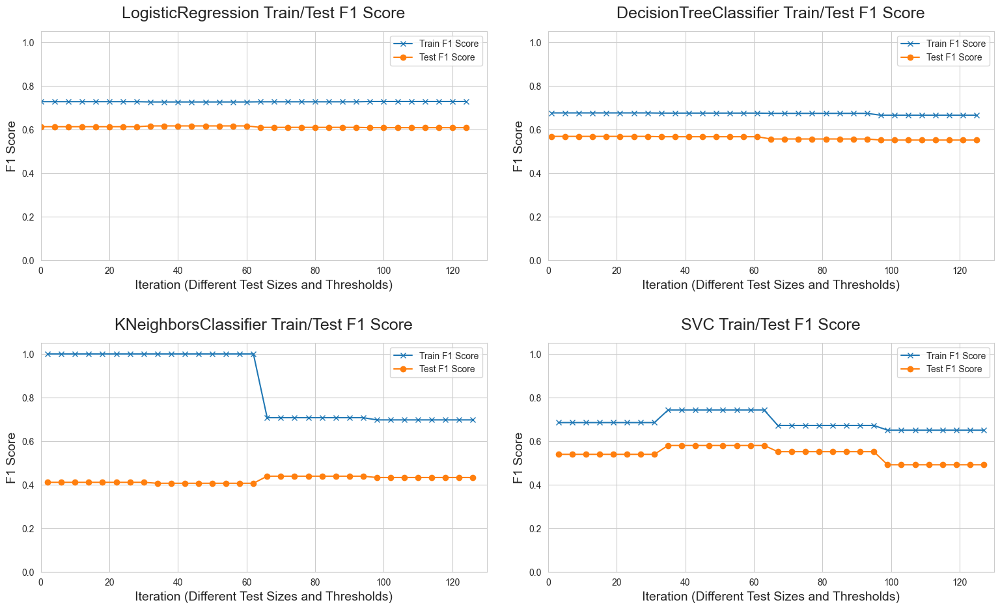

In [223]:
# Use a custom function to compare train/test scores for the 4 models
my.compare_metrics(all_results_df, 'F1 Score')

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Here we can see the Train vs. Test performance on F1 for all 4 models. There's not much difference on performance between Decision Trees, Logistic Regression, and SVC – just SVC has more variability through the iterations. KNN performs significantly worse on Test F1, it's significantly overfit on the majority class.
</div>

### Accuracy Score Comparisons

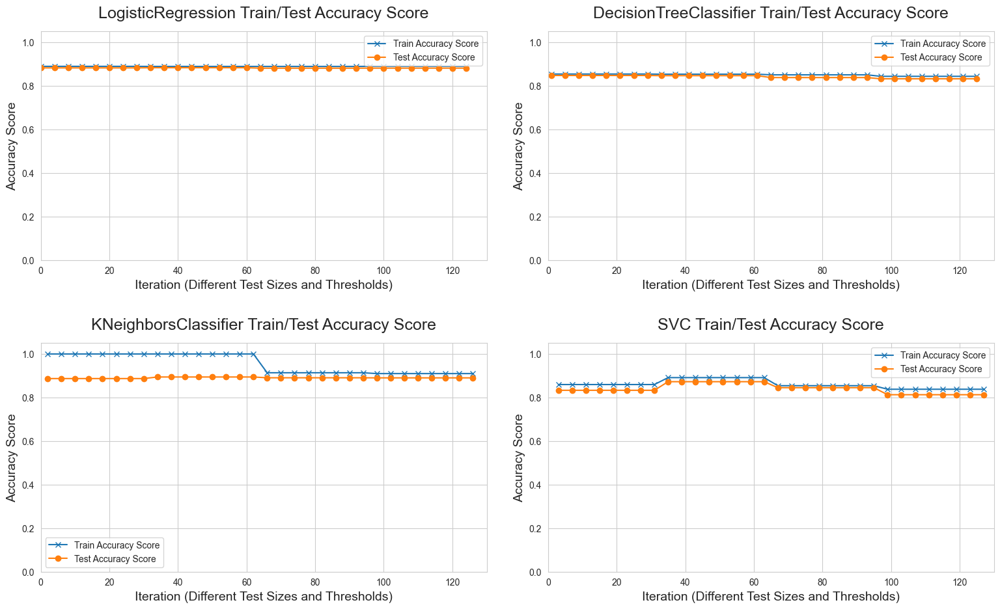

In [224]:
# Use a custom function to compare train/test scores for the 4 models
my.compare_metrics(all_results_df, 'Accuracy Score')

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Here we can see the Train vs. Test performance on Accuracy for all 4 models. Accuracy is not the best model, because it doesn't work well with imbalanced data – it's biased toward the majority class. Logistic Regression is the best in performance with very little overfit, but the Test Accuracy performance is roughly comparable for all.
</div>

### Precision Score Comparisons

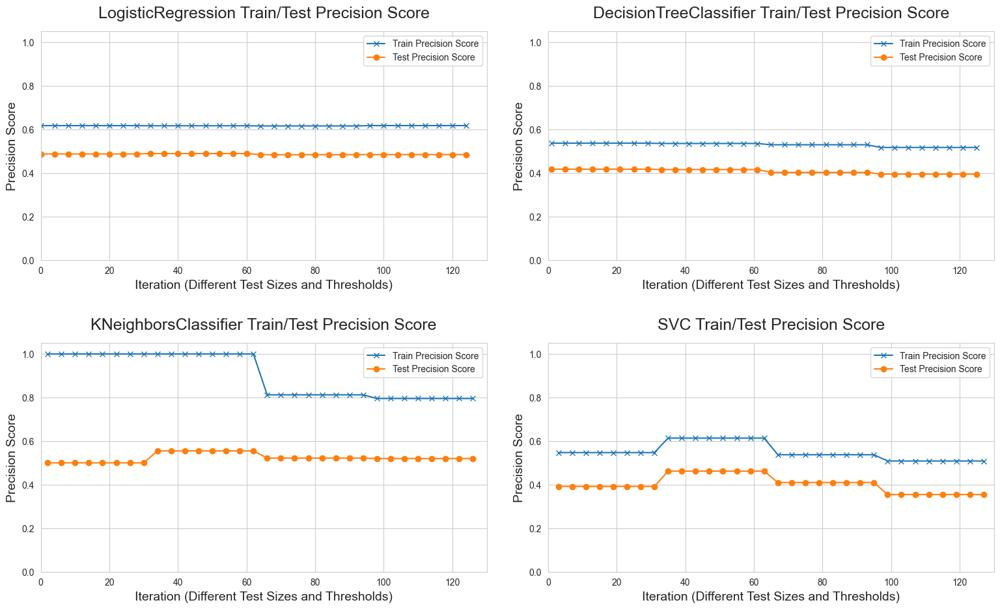

In [225]:
# Use a custom function to compare train/test scores for the 4 models
my.compare_metrics(all_results_df, 'Precision Score')

<div style="background-color: #def5dc; border: 1px solid #89c787; padding: 10px; border-radius: 3px;">
<b>Insight:</b> Here we can see the Train vs. Test performance on Precision for all 4 models. Given we're trying to find as much of the minority class as possible (Recall), we're sacrificing some precision, and that can be seen here. KNN seems to be the only one with greater than 0.50 Test Precision.
</div>

# Summary of Findings

## Descriptive Statistics

### Clients

Here's what we learned about the clients that were targeted by the marketing campaign:

* For their occupation, most were **Admins** (25.3%) or **Blue Collar** (22.47%).
* The majority of the clients were **Married** (60.52%).
* For education, most had either a **University Degree** (29.54%) or **Completed High School** (23.1%)
* Most had **No Personal Loan** (82.43%), but did have a **Housing Loan** (52.38%).
* Most had **No Default** (79.12%) on their credit.

### Campaigns

We've also learned some things about how they were contacted by phone as part of this campaign:

* The majority were contacted for the **First Time** (86.34%) and did not have a prior campaign outcome.
* Most were contacted during **Summer**: May (33.43%), June (12.91%), July (17.42%), August (15%). No one was contacted in January or February.
* The days of the week were evenly distributed between 19-21% each.
* Most were contacted on their **Cellphone** (63.47%)
* The majority **Declined the offer** (88.73%)

## Business Objectives

### 1. Describe Characteristics of Successful Deposits

Surprisingly, **macroeconomic factors** seem to have a strong influence on successful deposits:

* **Number Employed** has a moderate negative correlation at -0.35. This suggests that as the employment rate goes down, people are more likely to deposit. Perhaps a less favorable economic environment might drive people to save money rather than spend it, and thus deposits increase.
* **Euribor 3-Month** has a moderate negative correlation at -0.31. This is the average interest rate at which banks lend to each other for 3 month terms, set for the Euro region. When the Euribor 3-Month rate is low, borrowing costs are also low. It means that banks can borrow money cheaply, and they might pass on this benefit to their customers by offering higher interest rates on deposits. This makes deposits more attractive, and could explain the correlation.
* **Employment Variation Rate** has a moderate negative correlation at -0.30. This is the rate of change in employment levels from one quarter to the next. As this decreases or goes negative, it would indicate slowing or decreasing employment levels. This portrays a less favorable economic environment, which might prompt people to save money, thus an increase in deposits.
* **Consumer Price Index** has a slight negative correlation at -0.14. This is a measure of the prices paid for goods and services by consumers over time, and indicates inflation. If this is low, it could be that people have more savings on hand, and are more likely to save it. But this correlation is on the low side.

The direct marketing **campaign statistics** also had a strong influence on successful deposits: 

* **Success of the Previous Campaign** has a moderate positive correlation at 0.32. This suggests that a client that previously subscribed has a greater chance of subscribing again in the future.
* **Previously Contacted** has moderate positive correlation at 0.32, **Days Since Last Contact for Previous Campaign** has a slight positive correlation at 0.27, and **Number of Previous Contacts** has a slight positive correlation at 0.23. So it appears the number of previous contacts increase the chance that a client will subscribe, and the longer the timeframe after the last contact, the better the chances.
* **No Previous Outcome** has a slight negative correlation at -0.19, which is basically in alignment with what we've learned about the importance of prior contacts.
* **Contact by Telephone** has a slight negative correlation at -0.14, for unknown reasons.
* **March and October** have a slight positive correlation at 0.14, and **September** has a slight positive correlation at 0.12, so perhaps there's something about that time of the year that makes clients more likely to subscribe. In contrast, **May** has a slight negative correlation at -0.11, so perhaps that has the opposite effect.

Not many **client characteristics** stood out as having an impact on successful deposits:

* **No Credit Default** has a slight positive correlation at 0.1, suggesting those that never had a credit default are slightly more likely to deposit. This could perhaps mean that those who never had a default are more likely to plan for the future and save.
* **Students** and **Retired** have a slight positive correlation at 0.09, suggesting those clients are more likely to deposit, perhaps because students are thinking about their future, and retirees are trying to preserve the money they've accumulated in a low-risk vehicle. In contrast, **Blue Collar** workers have a slight negative correlation at -0.11, suggesting they are less likely to deposit - perhaps because they have less money to deposit, or more willing to take on riskier investments. 

### 2. Create Predictive Model

We took a systematic approach to exploring 4 different kinds of models: Logistic Regression, Decision Tree Classifier, K-Nearest Neighbors (KNN) Classifier, and Support Vector Machines (SVM). A baseline was established, and then a basic Logistic Regression model was built. It became clear the data was imbalanced, so the minority class was oversampled, and (where supported) class weights were balanced in the models. A random search was then run across (a) different Train/Test split test sizes, (b) proability thresholds for determining class, and (c) 36 different hyperparameter values (only a subset are relevant to each model). All together, 128 different model configurations were explored.

#### Evaluating Metrics

Given the business problem here, we chose **Recall** and **False Negative Rate** as the main metrics to evaluate model performance, though other metrics were examined to ensure as much of a balanced performance as possible. The banks make money on every person they convince to subscribe to a deposit. Without this analysis, they would've contacted everyone, which is expensive. So the goal is to eliminate as many clients as possible from the contact list – without sacrificing those that would likely make a deposit. So the best metric is Recall, which measures the model's ability to identify the positive class (a successful campaign resulting in a subscription to a term deposit). False Negatives represent actual positives that were mis-classified as negative, so the two metrics are related. We want to minimize the false negatives, as that represents a lost financial oportunity for the bank.

#### Best Model

After performing the search, the best model for maximum Recall and the least False Negatives is the following, which **successfully classified 93%** of the clients that would make a deposit, and **only missed 76** out 1,133 of them:

* **Model**: Logistic Regression (Index 32)
* **Test Size**: 0.25
* **Minority Oversample**: 0.20
* **Threshold**: 0.30
* **Recall**: 0.83 Test, 0.88 Train (Overfit, 0.05 difference)
* **F1**: 0.62 Test, 0.73 Train
* **Accuracy**: 0.88 Test, 0.89 Train
* **Precision**: 0.39 Test, 0.62 Train
* **True Positive Rate**: 0.93 (1,057 True Positives)
* **True Negative Rate**: 0.83 (7,356 True Negatives)
* **False Negative Rate**: 0.07 (76 False Negatives)
* **False Positive Rate**: 0.17 (1,560 False Positives)
* **Best Params**: 'logreg__solver': 'lbfgs', 'logreg__C': 1

Although there are better Recall scores for Decision Trees (0.91 was the best), the number of False Negatives and False Positives are worse than what we have for this Logistic Regression model. The Decision Tree model had 139 False Negatives, almost double, and 2,224 False Positives, almost 50% more. This illustrates that the final decision here is judgement call, and not simply taking the model with the highest score.

### 3. Compare Performance of Classifiers

While searching for the best model, the performance of the 4 different classification models were evaluated, and this is what we found:

#### Key Metrics

* **SVC** has the longest Fit Time by a longshot, and the longest Inference Time
* On the Train data, **KNN** had the highest Accuracy, Precision, and F1 scores, and the worst Recall scores. However, it was the most overfit, as represented by the difference in training and test scores. This is likely because of the imbalanced dataset, and the lack of options (like class weights) to help it pick up on the minority class.
* **Logistic Regression** and **Decision Trees** scored the best on True Positives (highest count) and False Negatives (lowest count). Similarly for the True Positive Rate and False Negative Rate.
* **Logistic Regression** and **Decision Trees** also scored the lowest on the total error represented by the False Rate (sum of False Positive and False Negative Rates). They were consistently on the low end here, whereas KNN and SVC had a much wider spread and dominated the high end. They were much more prone to error on the test set


#### Train vs. Test and Overfitting

* **Recall** – Decision Trees stand out for their (1) consistency across all the iterations, and (2) the low difference between Train and Test scores. Although every single model was overfit to some degree, Decision Trees were overfit the least. It's a negligable difference. KNN was affected significantly with the changing Test sizes and thresholds. It may be that a certain point, there was not enough training data to do well on the train test. Regarding Test Recall performance, Decision Trees and Logistic Regression perform the best, followed by SVC, and KNN is pretty bad.

* **F1** – There's not much difference on performance between Decision Trees, Logistic Regression, and SVC – just SVC has more variability through the iterations. KNN performs significantly worse on Test F1, it's significantly overfit on the majority class.

* **Accuracy** – Accuracy is not the best metric for our use case, because it doesn't work well with imbalanced data – it's biased toward the majority class. Logistic Regression is the best in performance with very little overfit, but the Test Accuracy performance is roughly comparable for all.

* **Precision** – Given we're trying to find as much of the minority class as possible (Recall), we're sacrificing some precision, and none of the models performed well with this metric. KNN seems to be the only one with greater than 0.50 Test Precision.

## Limitations

There are a few limitations in the data:

* **Duration:** This analysis included the Duration variable, which has a disclaimer in the data description: "this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model."
* **Unknown Values:** There were a large number of missing values (NaNs, or null values) that were encoded as 'Unknown' in this dataset. Most of these were retained and treated as an additional category, though a few records were dropped. 
* **999 Values:** During data cleaning, a number of '999' values were converted to '0' for 'pdays' – the number of days that passed after the client was last contacted from a previous campaign. Shifting this number removed the outlier effect, but it did also change the impact these numbers have on correlations. 

## Next Steps and Recommendations

Given the limitations and constraints of this analysis, this project could be followed up in the following ways:

* **Drop Duration:** A second round of analysis should be done with Duration dropped as a feature. This will likely lead to lower performance, and may require additional feature engineering or techniques to boost performance. But for a model that can truly be generalized to unseen data, this should be dropped.
* **Different Encodings:** Some of the data cleaning methods mentioned (ex: 999 values) could be revisited and treated differently in a follow-up analysis.
* **Different Models:** In this project, we only used 4 classification models: Logistic Regression, Decision Trees, KNN Classifier, and Support Vector Machines (SVM). Comparing this 4 models was an explicit goal. But there are other classification models that might yield better results: Rand Forest, and XGBoost, for instance.
* **Cost Factors:** The financial gain of a successful deposit should be quantified, in addition to the financial cost of a campaign. The model we ended up with maximizes finding all the successful depositors, but it does so at the expense of misclassifying a number of clients as depositors incorrectly. Ideally the financial gain from succesful deposits offsets the cost of contacting clients that ultimately don't deposit. 
* **Top Correlated Features:** A dataframe of the top correlated features was created, but we did not have time to do analysis of this dataset. This should be examined in a follow-up analysis.